In [ ]:
# Install detectron 2
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-dfz_59ru
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-dfz_59ru
  Resolved https://github.com/facebookresearch/detectron2.git to commit 5c380fdfc62b0124204155d6be3b1016e3dadb2d
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 745.7 kB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 9.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 14.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 13.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for detectron2: filename=detectron2-0.6-cp310-cp310-linux_x86_64.whl size=6147900 sha256=0099fa54358c0bae3eb44baa350

In [ ]:
import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

In [ ]:
CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'nwpu-vhr-10:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F3311446%2F5760765%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240504%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240504T214139Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D5f24ebb68224d1ca3b3218f6c575493dcfdd8d9777fc852e309eb2f714d44fc43ba6999e39c3b687a752bafd61a0d751bd5ab526a6c74807576b9d8ae3bc18e6849ea20abdd4c4cdf6bcc0bc7620e3606d5913121dc7aa336fe7606648689072f0e2950f3b229371f10c225f07c0ed4056b6032b991816bee4f753c436fa376168d84234ead8673764ad2f07f8be64e6feffc18846c767340adb01904e3c7bf45317b48f4eaec096e1fd8586d2359e9a64abe41119b8fa8969c5f02b56c18e0bc4d65c677394fc5846eb007e0d139d66136f8cdb34cd9b06d428e6ddfd40fc06d510f2f5e3ba90db302027b15c79962028b3924e32074c9040dfc8022cf1e35c'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


[==================================================] 190429943 bytes downloaded
Downloaded and uncompressed: nwpu-vhr-10
Data source import complete.


In [ ]:
# Importing Essential libraries
import matplotlib.pyplot as plt
#Importing CocoTools to load, manipulate, convert and visualize COCO format datasets
from pycocotools.coco import COCO
# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor, DefaultTrainer, HookBase
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.utils.visualizer import ColorMode
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
from detectron2.utils.logger import setup_logger
from detectron2.data.datasets import register_coco_instances
from detectron2.data import transforms as T
import random
import skimage.io as io
# Set base params
plt.rcParams["figure.figsize"] = [16,9]

In [ ]:
#Pointing cocotools to the location of the Json that describes the train dataset
#All dataset Json ??
coco = COCO('/kaggle/input/nwpu-vhr-10/NWPU VHR-10/train/train.json')

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!


In [ ]:
#Load categorries described in Json Files
cats=coco.loadCats(coco.getCatIds())
cats

[{'supercategory': 'airplane', 'id': 1, 'name': 'airplane'},
 {'supercategory': 'ship', 'id': 2, 'name': 'ship'},
 {'supercategory': 'storage tank', 'id': 3, 'name': 'storage tank'},
 {'supercategory': 'baseball diamond', 'id': 4, 'name': 'baseball diamond'},
 {'supercategory': 'tennis court', 'id': 5, 'name': 'tennis court'},
 {'supercategory': 'basketball court', 'id': 6, 'name': 'basketball court'},
 {'supercategory': 'ground track field',
  'id': 7,
  'name': 'ground track field'},
 {'supercategory': 'harbor', 'id': 8, 'name': 'harbor'},
 {'supercategory': 'bridge', 'id': 9, 'name': 'bridge'},
 {'supercategory': 'vehicle', 'id': 10, 'name': 'vehicle'}]

In [ ]:
#Extracting names from categories
names=[cat['name'] for cat in cats]
names

['airplane',
 'ship',
 'storage tank',
 'baseball diamond',
 'tennis court',
 'basketball court',
 'ground track field',
 'harbor',
 'bridge',
 'vehicle']

In [ ]:
help(coco.getImgIds)

Help on method getImgIds in module pycocotools.coco:

getImgIds(imgIds=[], catIds=[]) method of pycocotools.coco.COCO instance
    Get img ids that satisfy given filter conditions.
    :param imgIds (int array) : get imgs for given ids
    :param catIds (int array) : get imgs with all given cats
    :return: ids (int array)  : integer array of img ids



In [ ]:
catIds=coco.getCatIds(catNms=['tennis_court','basketball_court'])
# This gets the images where both or all of these categories are present in the image
imgIds = coco.getImgIds(catIds=catIds)

In [ ]:
print(imgIds)
#These are the images ids with both 'tennis_court','basketball_court' objects present (instances)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221,

In [ ]:
random_img_id=random.choice(imgIds)
random_img_id

149

In [ ]:
# Load the image
imgId = coco.getImgIds(imgIds = [random_img_id])
img = coco.loadImgs(imgId)[0]
print("Image details \n",img)

Image details 
 {'id': 149, 'file_name': '605.jpg', 'width': 876, 'height': 536}


In [ ]:
#get annotations (description of images' segmentation masks and bounding boxes of each object instance per images)
annIds = coco.getAnnIds(imgIds=imgId,iscrowd=None)
anns = coco.loadAnns(annIds)

In [ ]:
# Create a dictionary between category_id and category name
category_map = dict()

for ele in list(coco.cats.values()):
    category_map.update({ele['id']:ele['name']})
category_map

{1: 'airplane',
 2: 'ship',
 3: 'storage tank',
 4: 'baseball diamond',
 5: 'tennis court',
 6: 'basketball court',
 7: 'ground track field',
 8: 'harbor',
 9: 'bridge',
 10: 'vehicle'}

In [ ]:
train_img_dir = '/kaggle/input/nwpu-vhr-10/NWPU VHR-10/train'
test_img_dir = '/kaggle/input/nwpu-vhr-10/NWPU VHR-10/test'

Objects are: ['vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle']


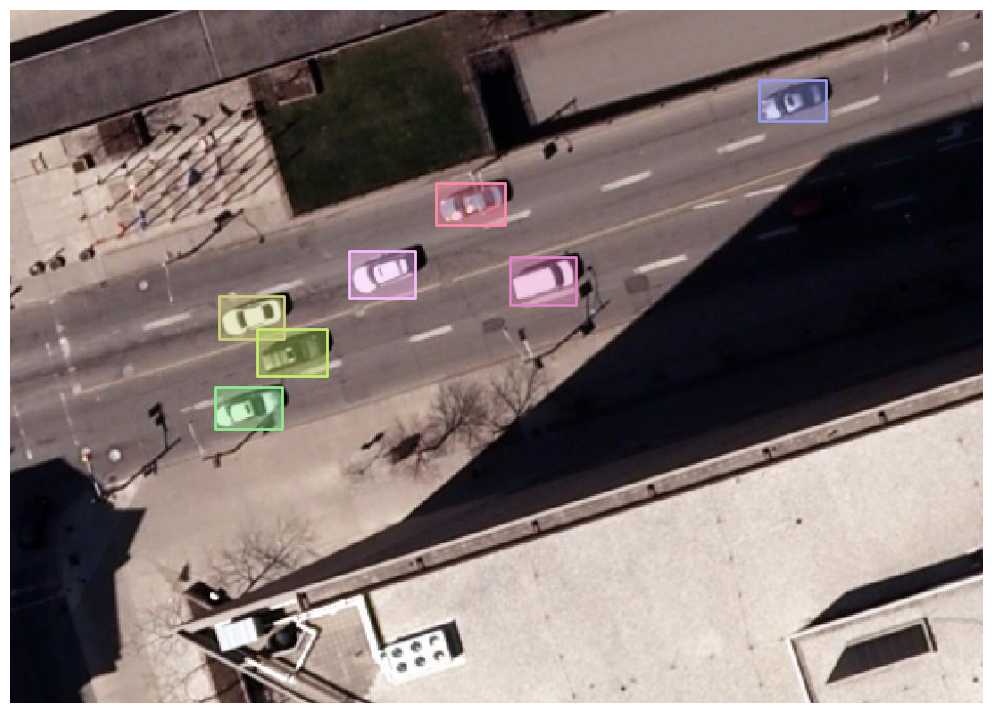

In [ ]:
#Create a list of objects in the image
parts = []
for region in anns:
    parts.append(category_map[region['category_id']])

print("Objects are:", parts)

#Plot Parts masks
I = io.imread(train_img_dir + '/' + img['file_name'])
plt.imshow(I)
plt.axis('off')
coco.showAnns(anns)

# Work with Detectron2

In [ ]:
# To find out inconsistent CUDA versions, if there is not "failed" word in this output then things are fine.
!python -m detectron2.utils.collect_env

-------------------------------  -----------------------------------------------------------------
sys.platform                     linux
Python                           3.10.12 (main, Nov 20 2023, 15:14:05) [GCC 11.4.0]
numpy                            1.25.2
detectron2                       0.6 @/usr/local/lib/python3.10/dist-packages/detectron2
Compiler                         GCC 11.4
CUDA compiler                    CUDA 12.2
detectron2 arch flags            7.5
DETECTRON2_ENV_MODULE            <not set>
PyTorch                          2.2.1+cu121 @/usr/local/lib/python3.10/dist-packages/torch
PyTorch debug build              False
torch._C._GLIBCXX_USE_CXX11_ABI  False
GPU available                    Yes
GPU 0                            Tesla T4 (arch=7.5)
Driver version                   535.104.05
CUDA_HOME                        /usr/local/cuda
Pillow                           9.4.0
torchvision                      0.17.1+cu121 @/usr/local/lib/python3.10/dist-packages/torch

In [ ]:
#!pip install echo1-coco-split

In [ ]:
#!coco-split --has_annotations --valid_ratio .0 --test_ratio .3 --annotations_file "/content/drive/MyDrive/VHR10/NWPU VHR-10 dataset/annotations.json"

In [ ]:
dataset_dir = "/kaggle/input/nwpu-vhr-10/NWPU VHR-10"

In [ ]:
register_coco_instances("train", {}, os.path.join(dataset_dir,"train", "train.json"), train_img_dir)
register_coco_instances("test", {}, os.path.join(dataset_dir,"test", "test.json"), test_img_dir)

In [ ]:
dataset_dicts = DatasetCatalog.get("train")
metadata_dicts = MetadataCatalog.get("train")

In [ ]:
print(dataset_dicts)

[{'file_name': '/kaggle/input/nwpu-vhr-10/NWPU VHR-10/train/413.jpg', 'height': 677, 'width': 938, 'image_id': 0, 'annotations': [{'iscrowd': 0, 'bbox': [595, 270, 55, 62], 'category_id': 9, 'segmentation': [[595, 270, 595, 332, 650, 332, 650, 270]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [747, 232, 47, 55], 'category_id': 9, 'segmentation': [[747, 232, 747, 287, 794, 287, 794, 232]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [700, 360, 69, 50], 'category_id': 9, 'segmentation': [[700, 360, 700, 410, 769, 410, 769, 360]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [786, 336, 64, 56], 'category_id': 9, 'segmentation': [[786, 336, 786, 392, 850, 392, 850, 336]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [860, 316, 57, 48], 'category_id': 9, 'segmentation': [[860, 316, 860, 364, 917, 364, 917, 316]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}, {'file_name': '/kaggle/input/nwpu-vhr-10/NWPU VHR-10/train/211.jpg', 'height':

In [ ]:
metadata_dicts

namespace(name='train',
          json_file='/kaggle/input/nwpu-vhr-10/NWPU VHR-10/train/train.json',
          image_root='/kaggle/input/nwpu-vhr-10/NWPU VHR-10/train',
          evaluator_type='coco',
          thing_classes=['airplane',
                         'ship',
                         'storage tank',
                         'baseball diamond',
                         'tennis court',
                         'basketball court',
                         'ground track field',
                         'harbor',
                         'bridge',
                         'vehicle'],
          thing_dataset_id_to_contiguous_id={1: 0,
                                             2: 1,
                                             3: 2,
                                             4: 3,
                                             5: 4,
                                             6: 5,
                                             7: 6,
                                            

# Data Augmentation

In [ ]:
from detectron2.data import detection_utils as utils
import detectron2.data.transforms as T
import copy
import torch

def custom_mapper(dataset_dict):
    dataset_dict = copy.deepcopy(dataset_dict)  # it will be modified by code below
    image = utils.read_image(dataset_dict["file_name"], format="BGR")
    transform_list = [
        T.Resize((1024,1024)),
        T.RandomBrightness(0.9, 1.2),
        T.RandomContrast(0.9, 1.2),
        T.RandomSaturation(0.9, 1.2),
#         T.RandomRotation(angle=[90, 90]),
        T.RandomLighting(0.7),
        T.RandomFlip(prob=0.5, horizontal=True, vertical=False),
        T.RandomFlip(prob=0.5, horizontal=False, vertical=True),
    ]
    image, transforms = T.apply_transform_gens(transform_list, image)
    dataset_dict["image"] = torch.as_tensor(image.transpose(2, 0, 1).astype("float32"))

    annos = [
        utils.transform_instance_annotations(obj, transforms, image.shape[:2])
        for obj in dataset_dict.pop("annotations")
        if obj.get("iscrowd", 0) == 0
    ]
    instances = utils.annotations_to_instances(annos, image.shape[:2])
    dataset_dict["instances"] = utils.filter_empty_instances(instances)
    return dataset_dict

In [ ]:
cfg = get_cfg()

# Load model with weights
base_model = "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
cfg.merge_from_file(model_zoo.get_config_file(base_model))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(base_model)

# Define Datasets
cfg.DATASETS.TRAIN = ("train",)
cfg.DATASETS.TEST = ("test",)

cfg.DATALOADER.NUM_WORKERS = 2
cfg.SOLVER.IMS_PER_BATCH = 2

cfg.SOLVER.BASE_LR = 0.001
cfg.SOLVER.GAMMA = 0.05
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128

cfg.SOLVER.WARMUP_ITERS = 50
cfg.SOLVER.MAX_ITER = 500
cfg.TEST.EVAL_PERIOD = 100

# Set number of classes
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 10
cfg.MODEL.RETINANET.NUM_CLASSES = 10
# Set optimizer to Adam
cfg.SOLVER.OPTIMIZER = "ADAM"
# Optionally set Adam specific parameters like betas and eps if you want different values than the defaults:
cfg.SOLVER.ADAM_BETAS = (0.9, 0.999)
cfg.SOLVER.ADAM_EPS = 1e-8
cfg.OUTPUT_DIR = 'train_output_augmented'

In [ ]:
from detectron2.data import build_detection_test_loader, build_detection_train_loader
class CustomTrainer(DefaultTrainer):
    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        if output_folder is None:
            os.makedirs("/kaggle/working/coco_eval_augmented", exist_ok=True)
            output_folder = "/kaggle/working/coco_eval_augmented"
        return COCOEvaluator(dataset_name, cfg, True, output_folder)
    #CocoEvaluator extracts CocoMetrics based on the predictions of the model

    @classmethod
    def build_train_loader(cls, cfg):
        return build_detection_train_loader(cfg, mapper=custom_mapper)

In [ ]:
trainer = CustomTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[05/05 13:58:23 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[05/05 13:58:23 d2.engine.train_loop]: Starting training from iteration 0


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/local/lib/python3.10/dist-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[05/05 13:58:43 d2.utils.events]:  eta: 0:05:35  iter: 19  total_loss: 3.021  loss_cls: 1.915  loss_box_reg: 0.3931  loss_mask: 0.6881  loss_rpn_cls: 0.09652  loss_rpn_loc: 0.02317    time: 0.7422  last_time: 0.8609  data_time: 0.0847  last_data_time: 0.1100   lr: 0.00038062  max_mem: 2614M
[05/05 13:59:02 d2.utils.events]:  eta: 0:05:07  iter: 39  total_loss: 1.991  loss_cls: 0.7329  loss_box_reg: 0.6144  loss_mask: 0.5579  loss_rpn_cls: 0.06119  loss_rpn_loc: 0.01775    time: 0.6853  last_time: 0.5764  data_time: 0.0318  last_data_time: 0.0129   lr: 0.00078022  max_mem: 2616M
[05/05 13:59:14 d2.utils.events]:  eta: 0:04:39  iter: 59  total_loss: 1.844  loss_cls: 0.656  loss_box_reg: 0.6892  loss_mask: 0.4279  loss_rpn_cls: 0.03349  loss_rpn_loc: 0.0151    time: 0.6556  last_time: 0.5794  data_time: 0.0264  last_data_time: 0.0279   lr: 0.001  max_mem: 2616M
[05/05 13:59:26 d2.utils.events]:  eta: 0:04:17  iter: 79  total_loss: 1.83  loss_cls: 0.7014  loss_box_reg: 0.7158  loss_mask: 0

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 13:59:41 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0018 s/iter. Inference: 0.1349 s/iter. Eval: 0.0833 s/iter. Total: 0.2200 s/iter. ETA=0:00:40
[05/05 13:59:46 d2.evaluation.evaluator]: Inference done 33/195. Dataloading: 0.0025 s/iter. Inference: 0.1324 s/iter. Eval: 0.0926 s/iter. Total: 0.2277 s/iter. ETA=0:00:36
[05/05 13:59:51 d2.evaluation.evaluator]: Inference done 55/195. Dataloading: 0.0028 s/iter. Inference: 0.1346 s/iter. Eval: 0.0915 s/iter. Total: 0.2291 s/iter. ETA=0:00:32
[05/05 13:59:56 d2.evaluation.evaluator]: Inference done 75/195. Dataloading: 0.0026 s/iter. Inference: 0.1337 s/iter. Eval: 0.1002 s/iter. Total: 0.2366 s/iter. ETA=0:00:28
[05/05 14:00:01 d2.evaluation.evaluator]: Inference done 95/195. Dataloading: 0.0028 s/iter. Inference: 0.1335 s/iter. Eval: 0.1049 s/iter. Total: 0.2413 s/iter. ETA=0:00:24
[05/05 14:00:06 d2.evaluation.evaluator]: Inference done 118/195. Dataloading: 0.0026 s/iter. Inference: 0.1323 s/iter. Eval: 0.10

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 14:01:30 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0018 s/iter. Inference: 0.1231 s/iter. Eval: 0.0489 s/iter. Total: 0.1739 s/iter. ETA=0:00:31
[05/05 14:01:35 d2.evaluation.evaluator]: Inference done 40/195. Dataloading: 0.0021 s/iter. Inference: 0.1202 s/iter. Eval: 0.0502 s/iter. Total: 0.1727 s/iter. ETA=0:00:26
[05/05 14:01:40 d2.evaluation.evaluator]: Inference done 63/195. Dataloading: 0.0026 s/iter. Inference: 0.1245 s/iter. Eval: 0.0660 s/iter. Total: 0.1932 s/iter. ETA=0:00:25
[05/05 14:01:45 d2.evaluation.evaluator]: Inference done 85/195. Dataloading: 0.0027 s/iter. Inference: 0.1269 s/iter. Eval: 0.0747 s/iter. Total: 0.2045 s/iter. ETA=0:00:22
[05/05 14:01:50 d2.evaluation.evaluator]: Inference done 110/195. Dataloading: 0.0029 s/iter. Inference: 0.1262 s/iter. Eval: 0.0758 s/iter. Total: 0.2050 s/iter. ETA=0:00:17
[05/05 14:01:55 d2.evaluation.evaluator]: Inference done 133/195. Dataloading: 0.0033 s/iter. Inference: 0.1272 s/iter. Eval: 0.0

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 14:02:08 d2.evaluation.evaluator]: Total inference time: 0:00:39.581615 (0.208324 s / iter per device, on 1 devices)
[05/05 14:02:08 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:24 (0.127070 s / iter per device, on 1 devices)
[05/05 14:02:08 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/05 14:02:08 d2.evaluation.coco_evaluation]: Saving results to /kaggle/working/coco_eval_augmented/coco_instances_results.json
[05/05 14:02:08 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
[05/05 14:02:08 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[05/05 14:02:08 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.14 seconds.
[05/05 14:02:08 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[05/05 14:02:09 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.04 second

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 14:03:13 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0019 s/iter. Inference: 0.1181 s/iter. Eval: 0.0226 s/iter. Total: 0.1427 s/iter. ETA=0:00:26
[05/05 14:03:18 d2.evaluation.evaluator]: Inference done 45/195. Dataloading: 0.0021 s/iter. Inference: 0.1165 s/iter. Eval: 0.0279 s/iter. Total: 0.1467 s/iter. ETA=0:00:22
[05/05 14:03:23 d2.evaluation.evaluator]: Inference done 71/195. Dataloading: 0.0026 s/iter. Inference: 0.1209 s/iter. Eval: 0.0449 s/iter. Total: 0.1686 s/iter. ETA=0:00:20
[05/05 14:03:28 d2.evaluation.evaluator]: Inference done 103/195. Dataloading: 0.0025 s/iter. Inference: 0.1198 s/iter. Eval: 0.0426 s/iter. Total: 0.1651 s/iter. ETA=0:00:15
[05/05 14:03:33 d2.evaluation.evaluator]: Inference done 134/195. Dataloading: 0.0057 s/iter. Inference: 0.1194 s/iter. Eval: 0.0398 s/iter. Total: 0.1651 s/iter. ETA=0:00:10
[05/05 14:03:38 d2.evaluation.evaluator]: Inference done 165/195. Dataloading: 0.0052 s/iter. Inference: 0.1193 s/iter. Eval: 0.

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 14:04:47 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0017 s/iter. Inference: 0.1172 s/iter. Eval: 0.0187 s/iter. Total: 0.1376 s/iter. ETA=0:00:25
[05/05 14:04:52 d2.evaluation.evaluator]: Inference done 45/195. Dataloading: 0.0040 s/iter. Inference: 0.1183 s/iter. Eval: 0.0233 s/iter. Total: 0.1458 s/iter. ETA=0:00:21
[05/05 14:04:58 d2.evaluation.evaluator]: Inference done 73/195. Dataloading: 0.0032 s/iter. Inference: 0.1205 s/iter. Eval: 0.0373 s/iter. Total: 0.1612 s/iter. ETA=0:00:19
[05/05 14:05:03 d2.evaluation.evaluator]: Inference done 105/195. Dataloading: 0.0033 s/iter. Inference: 0.1200 s/iter. Eval: 0.0368 s/iter. Total: 0.1603 s/iter. ETA=0:00:14
[05/05 14:05:08 d2.evaluation.evaluator]: Inference done 137/195. Dataloading: 0.0038 s/iter. Inference: 0.1201 s/iter. Eval: 0.0355 s/iter. Total: 0.1596 s/iter. ETA=0:00:09
[05/05 14:05:13 d2.evaluation.evaluator]: Inference done 171/195. Dataloading: 0.0037 s/iter. Inference: 0.1195 s/iter. Eval: 0.

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 14:06:29 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0053 s/iter. Inference: 0.1363 s/iter. Eval: 0.0246 s/iter. Total: 0.1662 s/iter. ETA=0:00:30
[05/05 14:06:34 d2.evaluation.evaluator]: Inference done 44/195. Dataloading: 0.0067 s/iter. Inference: 0.1264 s/iter. Eval: 0.0212 s/iter. Total: 0.1545 s/iter. ETA=0:00:23
[05/05 14:06:39 d2.evaluation.evaluator]: Inference done 76/195. Dataloading: 0.0047 s/iter. Inference: 0.1227 s/iter. Eval: 0.0294 s/iter. Total: 0.1569 s/iter. ETA=0:00:18
[05/05 14:06:44 d2.evaluation.evaluator]: Inference done 113/195. Dataloading: 0.0042 s/iter. Inference: 0.1201 s/iter. Eval: 0.0264 s/iter. Total: 0.1508 s/iter. ETA=0:00:12
[05/05 14:06:49 d2.evaluation.evaluator]: Inference done 148/195. Dataloading: 0.0041 s/iter. Inference: 0.1197 s/iter. Eval: 0.0251 s/iter. Total: 0.1490 s/iter. ETA=0:00:07
[05/05 14:06:54 d2.evaluation.evaluator]: Inference done 186/195. Dataloading: 0.0037 s/iter. Inference: 0.1181 s/iter. Eval: 0.

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 14:06:55 d2.evaluation.evaluator]: Total inference time: 0:00:27.705579 (0.145819 s / iter per device, on 1 devices)
[05/05 14:06:55 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:22 (0.118115 s / iter per device, on 1 devices)
[05/05 14:06:55 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/05 14:06:55 d2.evaluation.coco_evaluation]: Saving results to /kaggle/working/coco_eval_augmented/coco_instances_results.json
[05/05 14:06:55 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[05/05 14:06:55 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[05/05 14:06:56 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.10 seconds.
[05/05 14:06:56 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[05/05 14:06:56 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.04 second

In [ ]:
cfg.MODEL.WEIGHTS = "/content/train_output_augmented/model_final.pth"
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("test", cfg, False, output_dir="./output_augmented/")
val_loader = build_detection_test_loader(cfg, "test")
print(inference_on_dataset(predictor.model, val_loader, evaluator))

[05/05 14:11:14 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/train_output_augmented/model_final.pth ...
WARNING [05/05 14:11:14 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[05/05 14:11:14 d2.data.datasets.coco]: Loaded 195 images in COCO format from /kaggle/input/nwpu-vhr-10/NWPU VHR-10/test/test.json
[05/05 14:11:14 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/05 14:11:14 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[05/05 14:11:14 d2.data.common]: Serializing 195 elements to byte tensors and concatenating them all ...
[05/05 14:11:14 d2.data.common]: Serialized dataset takes 0.12 MiB
[05/05 14:11:14 d2.evaluation.evaluator]: Start inference on 195 batches


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 14:11:16 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0027 s/iter. Inference: 0.1068 s/iter. Eval: 0.0053 s/iter. Total: 0.1148 s/iter. ETA=0:00:21
[05/05 14:11:21 d2.evaluation.evaluator]: Inference done 54/195. Dataloading: 0.0030 s/iter. Inference: 0.1072 s/iter. Eval: 0.0069 s/iter. Total: 0.1172 s/iter. ETA=0:00:16
[05/05 14:11:26 d2.evaluation.evaluator]: Inference done 86/195. Dataloading: 0.0041 s/iter. Inference: 0.1167 s/iter. Eval: 0.0117 s/iter. Total: 0.1327 s/iter. ETA=0:00:14
[05/05 14:11:31 d2.evaluation.evaluator]: Inference done 124/195. Dataloading: 0.0046 s/iter. Inference: 0.1158 s/iter. Eval: 0.0126 s/iter. Total: 0.1332 s/iter. ETA=0:00:09
[05/05 14:11:36 d2.evaluation.evaluator]: Inference done 167/195. Dataloading: 0.0039 s/iter. Inference: 0.1137 s/iter. Eval: 0.0111 s/iter. Total: 0.1289 s/iter. ETA=0:00:03
[05/05 14:11:40 d2.evaluation.evaluator]: Total inference time: 0:00:25.013609 (0.131651 s / iter per device, on 1 devices)
[05/

In [ ]:
# After training, evaluate on the test dataset
evaluator = CustomTrainer.build_evaluator(cfg, "test", "./output_augmented/")
test_loader = build_detection_test_loader(cfg, "test")
metrics = inference_on_dataset(trainer.model, test_loader, evaluator)
print(metrics)

WARNING [05/05 14:11:48 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[05/05 14:11:48 d2.data.datasets.coco]: Loaded 195 images in COCO format from /kaggle/input/nwpu-vhr-10/NWPU VHR-10/test/test.json
[05/05 14:11:48 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/05 14:11:48 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[05/05 14:11:48 d2.data.common]: Serializing 195 elements to byte tensors and concatenating them all ...
[05/05 14:11:48 d2.data.common]: Serialized dataset takes 0.12 MiB
[05/05 14:11:48 d2.evaluation.evaluator]: Start inference on 195 batches


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 14:11:50 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0020 s/iter. Inference: 0.1115 s/iter. Eval: 0.0197 s/iter. Total: 0.1332 s/iter. ETA=0:00:24
[05/05 14:11:55 d2.evaluation.evaluator]: Inference done 49/195. Dataloading: 0.0036 s/iter. Inference: 0.1115 s/iter. Eval: 0.0181 s/iter. Total: 0.1333 s/iter. ETA=0:00:19
[05/05 14:12:00 d2.evaluation.evaluator]: Inference done 81/195. Dataloading: 0.0031 s/iter. Inference: 0.1122 s/iter. Eval: 0.0278 s/iter. Total: 0.1431 s/iter. ETA=0:00:16
[05/05 14:12:05 d2.evaluation.evaluator]: Inference done 118/195. Dataloading: 0.0033 s/iter. Inference: 0.1119 s/iter. Eval: 0.0260 s/iter. Total: 0.1413 s/iter. ETA=0:00:10
[05/05 14:12:10 d2.evaluation.evaluator]: Inference done 155/195. Dataloading: 0.0031 s/iter. Inference: 0.1122 s/iter. Eval: 0.0252 s/iter. Total: 0.1406 s/iter. ETA=0:00:05
[05/05 14:12:15 d2.evaluation.evaluator]: Inference done 195/195. Dataloading: 0.0029 s/iter. Inference: 0.1115 s/iter. Eval: 0.

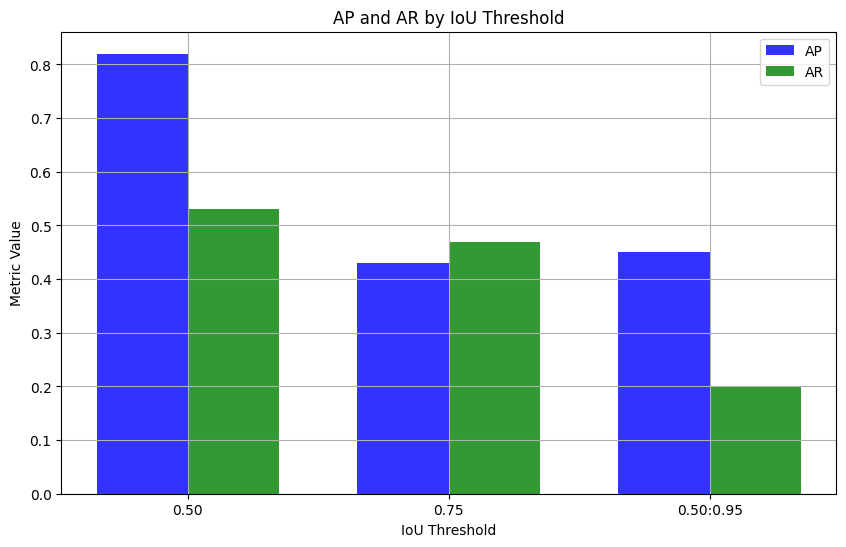

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Placeholder IoU threshold labels and corresponding AP/AR values
iou_thresholds = ['0.50', '0.75', '0.50:0.95']
ap_values = [0.82, 0.43, 0.45]  # AP values for each IoU threshold
ar_values = [0.53, 0.47, 0.20]  # AR values for each IoU threshold (assuming similar structure for simplification)

# Setting up the bar plot
bar_width = 0.35  # width of the bars
index = np.arange(len(iou_thresholds))  # the label locations

plt.figure(figsize=(10, 6))

# Plotting Average Precision
plt.bar(index - bar_width/2, ap_values, width=bar_width, label='AP', alpha=0.8, color='blue')

# Plotting Average Recall
plt.bar(index + bar_width/2, ar_values, width=bar_width, label='AR', alpha=0.8, color='green')

plt.xlabel('IoU Threshold')
plt.ylabel('Metric Value')
plt.title('AP and AR by IoU Threshold')
plt.xticks(index, iou_thresholds)
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
# Initialize the configuration
cfg = get_cfg()

# Load model with weights from a model configuration
base_model = "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
cfg.merge_from_file(model_zoo.get_config_file(base_model))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(base_model)

# Define Datasets for training and testing
cfg.DATASETS.TRAIN = ("train",)
cfg.DATASETS.TEST = ("test",)

# Set number of data loading workers
cfg.DATALOADER.NUM_WORKERS = 2

# Batch size for training (images per batch)
cfg.SOLVER.IMS_PER_BATCH = 2

# Base learning rate
cfg.SOLVER.BASE_LR = 0.0025

# Momentum for SGD
cfg.SOLVER.MOMENTUM = 0.9

# Weight decay for regularization
cfg.SOLVER.WEIGHT_DECAY = 0.0001

# Number of classes (adjust this as per your dataset)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 10
cfg.MODEL.RETINANET.NUM_CLASSES = 10

# SGD as the optimizer
cfg.SOLVER.OPTIMIZER = "SGD"

# Learning rate scheduling: decrease the learning rate at certain steps
cfg.SOLVER.STEPS = (1000, 1500)
cfg.SOLVER.GAMMA = 0.1

# Warm-up iterations before the main training starts
cfg.SOLVER.WARMUP_ITERS = 100

# Total number of training iterations
cfg.SOLVER.MAX_ITER = 500

# How often to perform evaluation on the test dataset
cfg.TEST.EVAL_PERIOD = 100

# Directory where output (models, logs) will be stored
cfg.OUTPUT_DIR = 'train_output_augmented'

print("Configuration setup completed. Ready to train the model.")


Configuration setup completed. Ready to train the model.


In [ ]:
from detectron2.data import build_detection_test_loader, build_detection_train_loader
class CustomTrainer(DefaultTrainer):
    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        if output_folder is None:
            os.makedirs("/kaggle/working/coco_eval_augmented", exist_ok=True)
            output_folder = "/kaggle/working/coco_eval_augmented"
        return COCOEvaluator(dataset_name, cfg, True, output_folder)
    #CocoEvaluator extracts CocoMetrics based on the predictions of the model

    @classmethod
    def build_train_loader(cls, cfg):
        return build_detection_train_loader(cfg, mapper=custom_mapper)

In [ ]:
trainer = CustomTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[05/05 14:22:04 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[05/05 14:22:04 d2.engine.train_loop]: Starting training from iteration 0


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 14:22:18 d2.utils.events]:  eta: 0:05:07  iter: 19  total_loss: 2.21  loss_cls: 1.303  loss_box_reg: 0.1376  loss_mask: 0.6877  loss_rpn_cls: 0.08959  loss_rpn_loc: 0.02748    time: 0.6525  last_time: 0.6466  data_time: 0.0511  last_data_time: 0.0355   lr: 0.00047702  max_mem: 3461M
[05/05 14:22:32 d2.utils.events]:  eta: 0:05:04  iter: 39  total_loss: 1.283  loss_cls: 0.4145  loss_box_reg: 0.2135  loss_mask: 0.558  loss_rpn_cls: 0.05792  loss_rpn_loc: 0.02309    time: 0.6682  last_time: 0.7103  data_time: 0.0270  last_data_time: 0.0271   lr: 0.00097652  max_mem: 3461M
[05/05 14:22:46 d2.utils.events]:  eta: 0:04:53  iter: 59  total_loss: 1.361  loss_cls: 0.4795  loss_box_reg: 0.3291  loss_mask: 0.3973  loss_rpn_cls: 0.03529  loss_rpn_loc: 0.02273    time: 0.6757  last_time: 0.7554  data_time: 0.0256  last_data_time: 0.0128   lr: 0.001476  max_mem: 3461M
[05/05 14:23:00 d2.utils.events]:  eta: 0:04:41  iter: 79  total_loss: 1.127  loss_cls: 0.3561  loss_box_reg: 0.3071  loss_mas

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 14:23:16 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0021 s/iter. Inference: 0.1184 s/iter. Eval: 0.0228 s/iter. Total: 0.1433 s/iter. ETA=0:00:26
[05/05 14:23:21 d2.evaluation.evaluator]: Inference done 44/195. Dataloading: 0.0022 s/iter. Inference: 0.1174 s/iter. Eval: 0.0326 s/iter. Total: 0.1523 s/iter. ETA=0:00:23
[05/05 14:23:26 d2.evaluation.evaluator]: Inference done 68/195. Dataloading: 0.0033 s/iter. Inference: 0.1232 s/iter. Eval: 0.0491 s/iter. Total: 0.1757 s/iter. ETA=0:00:22
[05/05 14:23:31 d2.evaluation.evaluator]: Inference done 96/195. Dataloading: 0.0030 s/iter. Inference: 0.1228 s/iter. Eval: 0.0507 s/iter. Total: 0.1767 s/iter. ETA=0:00:17
[05/05 14:23:36 d2.evaluation.evaluator]: Inference done 126/195. Dataloading: 0.0030 s/iter. Inference: 0.1222 s/iter. Eval: 0.0494 s/iter. Total: 0.1747 s/iter. ETA=0:00:12
[05/05 14:23:41 d2.evaluation.evaluator]: Inference done 157/195. Dataloading: 0.0030 s/iter. Inference: 0.1224 s/iter. Eval: 0.0

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 14:25:01 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0030 s/iter. Inference: 0.1217 s/iter. Eval: 0.0473 s/iter. Total: 0.1720 s/iter. ETA=0:00:31
[05/05 14:25:06 d2.evaluation.evaluator]: Inference done 41/195. Dataloading: 0.0036 s/iter. Inference: 0.1217 s/iter. Eval: 0.0428 s/iter. Total: 0.1683 s/iter. ETA=0:00:25
[05/05 14:25:11 d2.evaluation.evaluator]: Inference done 68/195. Dataloading: 0.0031 s/iter. Inference: 0.1237 s/iter. Eval: 0.0536 s/iter. Total: 0.1806 s/iter. ETA=0:00:22
[05/05 14:25:16 d2.evaluation.evaluator]: Inference done 91/195. Dataloading: 0.0039 s/iter. Inference: 0.1261 s/iter. Eval: 0.0607 s/iter. Total: 0.1908 s/iter. ETA=0:00:19
[05/05 14:25:22 d2.evaluation.evaluator]: Inference done 122/195. Dataloading: 0.0037 s/iter. Inference: 0.1243 s/iter. Eval: 0.0564 s/iter. Total: 0.1845 s/iter. ETA=0:00:13
[05/05 14:25:27 d2.evaluation.evaluator]: Inference done 149/195. Dataloading: 0.0035 s/iter. Inference: 0.1247 s/iter. Eval: 0.0

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 14:26:48 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0017 s/iter. Inference: 0.1157 s/iter. Eval: 0.0136 s/iter. Total: 0.1310 s/iter. ETA=0:00:24
[05/05 14:26:53 d2.evaluation.evaluator]: Inference done 50/195. Dataloading: 0.0022 s/iter. Inference: 0.1137 s/iter. Eval: 0.0141 s/iter. Total: 0.1302 s/iter. ETA=0:00:18
[05/05 14:26:58 d2.evaluation.evaluator]: Inference done 81/195. Dataloading: 0.0030 s/iter. Inference: 0.1169 s/iter. Eval: 0.0238 s/iter. Total: 0.1438 s/iter. ETA=0:00:16
[05/05 14:27:03 d2.evaluation.evaluator]: Inference done 120/195. Dataloading: 0.0028 s/iter. Inference: 0.1150 s/iter. Eval: 0.0212 s/iter. Total: 0.1392 s/iter. ETA=0:00:10
[05/05 14:27:08 d2.evaluation.evaluator]: Inference done 154/195. Dataloading: 0.0031 s/iter. Inference: 0.1163 s/iter. Eval: 0.0219 s/iter. Total: 0.1414 s/iter. ETA=0:00:05
[05/05 14:27:13 d2.evaluation.evaluator]: Inference done 194/195. Dataloading: 0.0029 s/iter. Inference: 0.1154 s/iter. Eval: 0.

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 14:28:26 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0018 s/iter. Inference: 0.1177 s/iter. Eval: 0.0268 s/iter. Total: 0.1462 s/iter. ETA=0:00:26
[05/05 14:28:31 d2.evaluation.evaluator]: Inference done 46/195. Dataloading: 0.0022 s/iter. Inference: 0.1170 s/iter. Eval: 0.0251 s/iter. Total: 0.1445 s/iter. ETA=0:00:21
[05/05 14:28:37 d2.evaluation.evaluator]: Inference done 70/195. Dataloading: 0.0032 s/iter. Inference: 0.1217 s/iter. Eval: 0.0448 s/iter. Total: 0.1698 s/iter. ETA=0:00:21
[05/05 14:28:42 d2.evaluation.evaluator]: Inference done 100/195. Dataloading: 0.0032 s/iter. Inference: 0.1216 s/iter. Eval: 0.0440 s/iter. Total: 0.1689 s/iter. ETA=0:00:16
[05/05 14:28:47 d2.evaluation.evaluator]: Inference done 132/195. Dataloading: 0.0040 s/iter. Inference: 0.1212 s/iter. Eval: 0.0413 s/iter. Total: 0.1666 s/iter. ETA=0:00:10
[05/05 14:28:52 d2.evaluation.evaluator]: Inference done 164/195. Dataloading: 0.0037 s/iter. Inference: 0.1209 s/iter. Eval: 0.

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 14:28:56 d2.evaluation.evaluator]: Total inference time: 0:00:30.675671 (0.161451 s / iter per device, on 1 devices)
[05/05 14:28:56 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:22 (0.120026 s / iter per device, on 1 devices)
[05/05 14:28:56 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/05 14:28:56 d2.evaluation.coco_evaluation]: Saving results to /kaggle/working/coco_eval_augmented/coco_instances_results.json
[05/05 14:28:56 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
[05/05 14:28:56 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[05/05 14:28:56 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.07 seconds.
[05/05 14:28:56 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[05/05 14:28:56 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.03 second

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 14:30:13 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0074 s/iter. Inference: 0.1197 s/iter. Eval: 0.0125 s/iter. Total: 0.1397 s/iter. ETA=0:00:25
[05/05 14:30:18 d2.evaluation.evaluator]: Inference done 50/195. Dataloading: 0.0034 s/iter. Inference: 0.1156 s/iter. Eval: 0.0115 s/iter. Total: 0.1307 s/iter. ETA=0:00:18
[05/05 14:30:23 d2.evaluation.evaluator]: Inference done 85/195. Dataloading: 0.0029 s/iter. Inference: 0.1162 s/iter. Eval: 0.0184 s/iter. Total: 0.1376 s/iter. ETA=0:00:15
[05/05 14:30:28 d2.evaluation.evaluator]: Inference done 121/195. Dataloading: 0.0032 s/iter. Inference: 0.1157 s/iter. Eval: 0.0193 s/iter. Total: 0.1383 s/iter. ETA=0:00:10
[05/05 14:30:33 d2.evaluation.evaluator]: Inference done 158/195. Dataloading: 0.0029 s/iter. Inference: 0.1166 s/iter. Eval: 0.0184 s/iter. Total: 0.1381 s/iter. ETA=0:00:05


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 14:30:38 d2.evaluation.evaluator]: Total inference time: 0:00:26.106975 (0.137405 s / iter per device, on 1 devices)
[05/05 14:30:38 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:22 (0.116609 s / iter per device, on 1 devices)
[05/05 14:30:38 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/05 14:30:38 d2.evaluation.coco_evaluation]: Saving results to /kaggle/working/coco_eval_augmented/coco_instances_results.json
[05/05 14:30:38 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[05/05 14:30:38 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[05/05 14:30:38 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.06 seconds.
[05/05 14:30:38 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[05/05 14:30:38 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.03 second

In [ ]:
cfg.MODEL.WEIGHTS = "/content/train_output_augmented/model_final.pth"
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("test", cfg, False, output_dir="./output_augmented/")
val_loader = build_detection_test_loader(cfg, "test")
print(inference_on_dataset(predictor.model, val_loader, evaluator))

[05/05 14:32:36 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/train_output_augmented/model_final.pth ...
WARNING [05/05 14:32:36 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[05/05 14:32:36 d2.data.datasets.coco]: Loaded 195 images in COCO format from /kaggle/input/nwpu-vhr-10/NWPU VHR-10/test/test.json
[05/05 14:32:36 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/05 14:32:36 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[05/05 14:32:36 d2.data.common]: Serializing 195 elements to byte tensors and concatenating them all ...
[05/05 14:32:36 d2.data.common]: Serialized dataset takes 0.12 MiB
[05/05 14:32:36 d2.evaluation.evaluator]: Start inference on 195 batches


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 14:32:39 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0063 s/iter. Inference: 0.1311 s/iter. Eval: 0.0065 s/iter. Total: 0.1439 s/iter. ETA=0:00:26
[05/05 14:32:44 d2.evaluation.evaluator]: Inference done 53/195. Dataloading: 0.0037 s/iter. Inference: 0.1133 s/iter. Eval: 0.0061 s/iter. Total: 0.1233 s/iter. ETA=0:00:17
[05/05 14:32:49 d2.evaluation.evaluator]: Inference done 89/195. Dataloading: 0.0041 s/iter. Inference: 0.1148 s/iter. Eval: 0.0119 s/iter. Total: 0.1310 s/iter. ETA=0:00:13
[05/05 14:32:54 d2.evaluation.evaluator]: Inference done 133/195. Dataloading: 0.0035 s/iter. Inference: 0.1124 s/iter. Eval: 0.0098 s/iter. Total: 0.1259 s/iter. ETA=0:00:07
[05/05 14:32:59 d2.evaluation.evaluator]: Inference done 176/195. Dataloading: 0.0031 s/iter. Inference: 0.1113 s/iter. Eval: 0.0090 s/iter. Total: 0.1236 s/iter. ETA=0:00:02
[05/05 14:33:01 d2.evaluation.evaluator]: Total inference time: 0:00:23.712473 (0.124802 s / iter per device, on 1 devices)
[05/

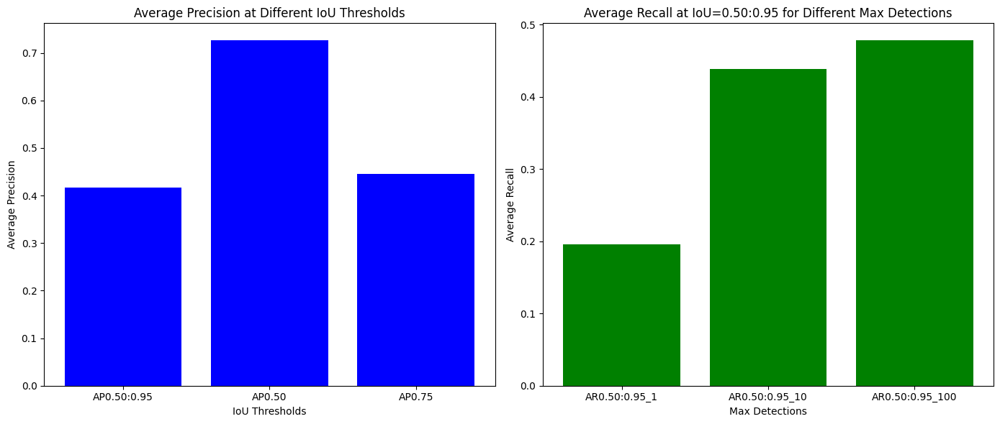

In [ ]:
import matplotlib.pyplot as plt

# Example values extracted from your results
ap_iou_values = {
    'AP0.50:0.95': 0.417,  # Overall AP across IoU thresholds 0.50 to 0.95
    'AP0.50': 0.726,       # AP at IoU=0.50
    'AP0.75': 0.446        # AP at IoU=0.75
}

ar_iou_values = {
    'AR0.50:0.95_1': 0.196,  # AR for IoU=0.50:0.95 at maxDet=1
    'AR0.50:0.95_10': 0.439, # AR for IoU=0.50:0.95 at maxDet=10
    'AR0.50:0.95_100': 0.478 # AR for IoU=0.50:0.95 at maxDet=100
}

# Names and values for plotting
ap_categories = list(ap_iou_values.keys())
ap_scores = [ap_iou_values[cat] for cat in ap_categories]

ar_categories = list(ar_iou_values.keys())
ar_scores = [ar_iou_values[rec] for rec in ar_categories]

# Plotting AP values for different IoU thresholds
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)  # First subplot for AP
plt.bar(ap_categories, ap_scores, color='blue')
plt.title('Average Precision at Different IoU Thresholds')
plt.xlabel('IoU Thresholds')
plt.ylabel('Average Precision')

# Plotting AR values for different max detections at specific IoU range
plt.subplot(1, 2, 2)  # Second subplot for AR
plt.bar(ar_categories, ar_scores, color='green')
plt.title('Average Recall at IoU=0.50:0.95 for Different Max Detections')
plt.xlabel('Max Detections')
plt.ylabel('Average Recall')

plt.tight_layout()
plt.show()


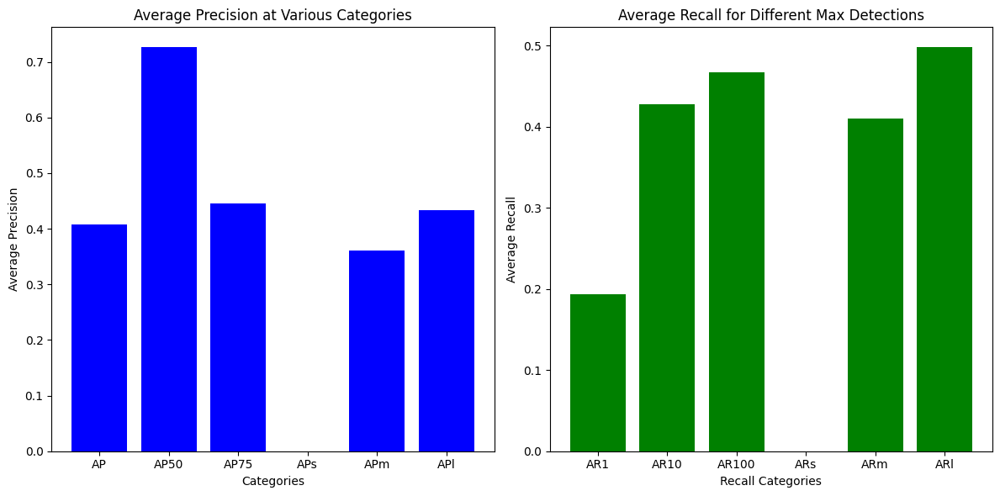

In [ ]:
import matplotlib.pyplot as plt

# Assuming 'results' contains your evaluation results
results = {
    'AP': 0.407, 'AP50': 0.726, 'AP75': 0.446,
    'APs': 0.000, 'APm': 0.361, 'APl': 0.434,
    'AR1': 0.194, 'AR10': 0.428, 'AR100': 0.467,
    'ARs': 0.000, 'ARm': 0.410, 'ARl': 0.498
}

# Categories for AP and AR
categories = ['AP', 'AP50', 'AP75', 'APs', 'APm', 'APl']
recalls = ['AR1', 'AR10', 'AR100', 'ARs', 'ARm', 'ARl']

# Extracting AP and AR values
ap_values = [results[cat] for cat in categories]
ar_values = [results[rec] for rec in recalls]

# Plotting AP values
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)  # First subplot for AP
plt.bar(categories, ap_values, color='blue')
plt.title('Average Precision at Various Categories')
plt.xlabel('Categories')
plt.ylabel('Average Precision')

# Plotting AR values
plt.subplot(1, 2, 2)  # Second subplot for AR
plt.bar(recalls, ar_values, color='green')
plt.title('Average Recall for Different Max Detections')
plt.xlabel('Recall Categories')
plt.ylabel('Average Recall')

plt.tight_layout()
plt.show()


In [ ]:
from detectron2.config import get_cfg
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator
from detectron2.data import build_detection_test_loader, build_detection_train_loader
from detectron2 import model_zoo

cfg = get_cfg()

# Load model with weights
base_model = "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
cfg.merge_from_file(model_zoo.get_config_file(base_model))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(base_model)

# Define Datasets
cfg.DATASETS.TRAIN = ("train",)
cfg.DATASETS.TEST = ("test",)

cfg.DATALOADER.NUM_WORKERS = 2
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.001
cfg.SOLVER.GAMMA = 0.05
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.SOLVER.WARMUP_ITERS = 50
cfg.SOLVER.MAX_ITER = 500
cfg.TEST.EVAL_PERIOD = 100

# Set number of classes
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 10
cfg.MODEL.RETINANET.NUM_CLASSES = 10

# Set optimizer to RMSprop
cfg.SOLVER.OPTIMIZER = "RMS_PROP"
# Optionally set RMSprop specific parameters like momentum and epsilon if you want different values than the defaults:
cfg.SOLVER.RMS_PROP_ALPHA = 0.99  # Default is usually around 0.9 or 0.99
cfg.SOLVER.RMS_PROP_MOMENTUM = 0.0  # Can be set to enable momentum
cfg.SOLVER.RMS_PROP_EPS = 1e-8  # Small value to prevent division by zero

cfg.OUTPUT_DIR = 'train_output_augmented'


In [ ]:
class CustomTrainer(DefaultTrainer):
    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        if output_folder is None:
            os.makedirs("/kaggle/working/coco_eval_augmented", exist_ok=True)
            output_folder = "/kaggle/working/coco_eval_augmented"
        return COCOEvaluator(dataset_name, cfg, True, output_folder)

    @classmethod
    def build_train_loader(cls, cfg):
        return build_detection_train_loader(cfg, mapper=custom_mapper)

In [ ]:
trainer = CustomTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[05/05 14:33:21 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[05/05 14:33:21 d2.engine.train_loop]: Starting training from iteration 0


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 14:33:35 d2.utils.events]:  eta: 0:04:40  iter: 19  total_loss: 3.08  loss_cls: 1.916  loss_box_reg: 0.3341  loss_mask: 0.676  loss_rpn_cls: 0.06072  loss_rpn_loc: 0.0188    time: 0.6150  last_time: 0.5389  data_time: 0.0766  last_data_time: 0.0145   lr: 0.00038062  max_mem: 3461M
[05/05 14:33:47 d2.utils.events]:  eta: 0:04:29  iter: 39  total_loss: 1.983  loss_cls: 0.7446  loss_box_reg: 0.4763  loss_mask: 0.5768  loss_rpn_cls: 0.07637  loss_rpn_loc: 0.0227    time: 0.6058  last_time: 0.5747  data_time: 0.0219  last_data_time: 0.0249   lr: 0.00078022  max_mem: 3461M
[05/05 14:33:59 d2.utils.events]:  eta: 0:04:20  iter: 59  total_loss: 1.892  loss_cls: 0.701  loss_box_reg: 0.7046  loss_mask: 0.4432  loss_rpn_cls: 0.02827  loss_rpn_loc: 0.02833    time: 0.6050  last_time: 0.5515  data_time: 0.0274  last_data_time: 0.0145   lr: 0.001  max_mem: 3461M
[05/05 14:34:11 d2.utils.events]:  eta: 0:04:08  iter: 79  total_loss: 1.781  loss_cls: 0.6534  loss_box_reg: 0.7229  loss_mask: 0.3

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 14:34:27 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0020 s/iter. Inference: 0.1396 s/iter. Eval: 0.1412 s/iter. Total: 0.2829 s/iter. ETA=0:00:52
[05/05 14:34:33 d2.evaluation.evaluator]: Inference done 29/195. Dataloading: 0.0026 s/iter. Inference: 0.1406 s/iter. Eval: 0.1451 s/iter. Total: 0.2886 s/iter. ETA=0:00:47
[05/05 14:34:38 d2.evaluation.evaluator]: Inference done 49/195. Dataloading: 0.0026 s/iter. Inference: 0.1388 s/iter. Eval: 0.1336 s/iter. Total: 0.2752 s/iter. ETA=0:00:40
[05/05 14:34:43 d2.evaluation.evaluator]: Inference done 65/195. Dataloading: 0.0027 s/iter. Inference: 0.1403 s/iter. Eval: 0.1429 s/iter. Total: 0.2860 s/iter. ETA=0:00:37
[05/05 14:34:48 d2.evaluation.evaluator]: Inference done 82/195. Dataloading: 0.0026 s/iter. Inference: 0.1405 s/iter. Eval: 0.1456 s/iter. Total: 0.2888 s/iter. ETA=0:00:32
[05/05 14:34:53 d2.evaluation.evaluator]: Inference done 100/195. Dataloading: 0.0028 s/iter. Inference: 0.1404 s/iter. Eval: 0.14

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 14:36:26 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0023 s/iter. Inference: 0.1142 s/iter. Eval: 0.0240 s/iter. Total: 0.1405 s/iter. ETA=0:00:25
[05/05 14:36:31 d2.evaluation.evaluator]: Inference done 46/195. Dataloading: 0.0022 s/iter. Inference: 0.1154 s/iter. Eval: 0.0276 s/iter. Total: 0.1454 s/iter. ETA=0:00:21
[05/05 14:36:36 d2.evaluation.evaluator]: Inference done 70/195. Dataloading: 0.0029 s/iter. Inference: 0.1198 s/iter. Eval: 0.0466 s/iter. Total: 0.1695 s/iter. ETA=0:00:21
[05/05 14:36:42 d2.evaluation.evaluator]: Inference done 101/195. Dataloading: 0.0027 s/iter. Inference: 0.1194 s/iter. Eval: 0.0458 s/iter. Total: 0.1680 s/iter. ETA=0:00:15
[05/05 14:36:47 d2.evaluation.evaluator]: Inference done 135/195. Dataloading: 0.0025 s/iter. Inference: 0.1187 s/iter. Eval: 0.0418 s/iter. Total: 0.1632 s/iter. ETA=0:00:09
[05/05 14:36:52 d2.evaluation.evaluator]: Inference done 164/195. Dataloading: 0.0030 s/iter. Inference: 0.1197 s/iter. Eval: 0.

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 14:36:56 d2.evaluation.evaluator]: Total inference time: 0:00:30.752378 (0.161855 s / iter per device, on 1 devices)
[05/05 14:36:56 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:22 (0.118816 s / iter per device, on 1 devices)
[05/05 14:36:56 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/05 14:36:56 d2.evaluation.coco_evaluation]: Saving results to /kaggle/working/coco_eval_augmented/coco_instances_results.json
[05/05 14:36:56 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
[05/05 14:36:56 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[05/05 14:36:56 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.09 seconds.
[05/05 14:36:56 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[05/05 14:36:56 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.04 second

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 14:38:01 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0019 s/iter. Inference: 0.1175 s/iter. Eval: 0.0255 s/iter. Total: 0.1450 s/iter. ETA=0:00:26
[05/05 14:38:06 d2.evaluation.evaluator]: Inference done 45/195. Dataloading: 0.0037 s/iter. Inference: 0.1193 s/iter. Eval: 0.0270 s/iter. Total: 0.1502 s/iter. ETA=0:00:22
[05/05 14:38:11 d2.evaluation.evaluator]: Inference done 74/195. Dataloading: 0.0031 s/iter. Inference: 0.1203 s/iter. Eval: 0.0367 s/iter. Total: 0.1602 s/iter. ETA=0:00:19
[05/05 14:38:16 d2.evaluation.evaluator]: Inference done 105/195. Dataloading: 0.0031 s/iter. Inference: 0.1207 s/iter. Eval: 0.0374 s/iter. Total: 0.1614 s/iter. ETA=0:00:14
[05/05 14:38:21 d2.evaluation.evaluator]: Inference done 138/195. Dataloading: 0.0031 s/iter. Inference: 0.1205 s/iter. Eval: 0.0354 s/iter. Total: 0.1591 s/iter. ETA=0:00:09
[05/05 14:38:27 d2.evaluation.evaluator]: Inference done 172/195. Dataloading: 0.0030 s/iter. Inference: 0.1197 s/iter. Eval: 0.

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 14:39:35 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0020 s/iter. Inference: 0.1147 s/iter. Eval: 0.0156 s/iter. Total: 0.1322 s/iter. ETA=0:00:24
[05/05 14:39:40 d2.evaluation.evaluator]: Inference done 49/195. Dataloading: 0.0021 s/iter. Inference: 0.1142 s/iter. Eval: 0.0167 s/iter. Total: 0.1332 s/iter. ETA=0:00:19
[05/05 14:39:45 d2.evaluation.evaluator]: Inference done 77/195. Dataloading: 0.0027 s/iter. Inference: 0.1172 s/iter. Eval: 0.0311 s/iter. Total: 0.1511 s/iter. ETA=0:00:17
[05/05 14:39:50 d2.evaluation.evaluator]: Inference done 114/195. Dataloading: 0.0025 s/iter. Inference: 0.1160 s/iter. Eval: 0.0280 s/iter. Total: 0.1466 s/iter. ETA=0:00:11
[05/05 14:39:56 d2.evaluation.evaluator]: Inference done 150/195. Dataloading: 0.0025 s/iter. Inference: 0.1167 s/iter. Eval: 0.0264 s/iter. Total: 0.1457 s/iter. ETA=0:00:06
[05/05 14:40:01 d2.evaluation.evaluator]: Inference done 185/195. Dataloading: 0.0025 s/iter. Inference: 0.1164 s/iter. Eval: 0.

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 14:41:13 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0017 s/iter. Inference: 0.1185 s/iter. Eval: 0.0252 s/iter. Total: 0.1454 s/iter. ETA=0:00:26
[05/05 14:41:18 d2.evaluation.evaluator]: Inference done 47/195. Dataloading: 0.0021 s/iter. Inference: 0.1158 s/iter. Eval: 0.0239 s/iter. Total: 0.1419 s/iter. ETA=0:00:21
[05/05 14:41:23 d2.evaluation.evaluator]: Inference done 74/195. Dataloading: 0.0024 s/iter. Inference: 0.1189 s/iter. Eval: 0.0389 s/iter. Total: 0.1603 s/iter. ETA=0:00:19
[05/05 14:41:28 d2.evaluation.evaluator]: Inference done 109/195. Dataloading: 0.0023 s/iter. Inference: 0.1179 s/iter. Eval: 0.0350 s/iter. Total: 0.1553 s/iter. ETA=0:00:13
[05/05 14:41:33 d2.evaluation.evaluator]: Inference done 143/195. Dataloading: 0.0023 s/iter. Inference: 0.1179 s/iter. Eval: 0.0338 s/iter. Total: 0.1541 s/iter. ETA=0:00:08
[05/05 14:41:39 d2.evaluation.evaluator]: Inference done 176/195. Dataloading: 0.0026 s/iter. Inference: 0.1178 s/iter. Eval: 0.

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 14:41:41 d2.evaluation.evaluator]: Total inference time: 0:00:29.097042 (0.153142 s / iter per device, on 1 devices)
[05/05 14:41:41 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:22 (0.117519 s / iter per device, on 1 devices)
[05/05 14:41:41 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/05 14:41:41 d2.evaluation.coco_evaluation]: Saving results to /kaggle/working/coco_eval_augmented/coco_instances_results.json
[05/05 14:41:41 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
[05/05 14:41:41 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[05/05 14:41:42 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.08 seconds.
[05/05 14:41:42 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[05/05 14:41:42 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.03 second

In [ ]:
cfg.MODEL.WEIGHTS = "/content/train_output_augmented/model_final.pth"
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("test", cfg, False, output_dir="./output_augmented/")
val_loader = build_detection_test_loader(cfg, "test")
print(inference_on_dataset(predictor.model, val_loader, evaluator))

[05/05 14:42:03 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/train_output_augmented/model_final.pth ...
WARNING [05/05 14:42:04 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[05/05 14:42:04 d2.data.datasets.coco]: Loaded 195 images in COCO format from /kaggle/input/nwpu-vhr-10/NWPU VHR-10/test/test.json
[05/05 14:42:04 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/05 14:42:04 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[05/05 14:42:04 d2.data.common]: Serializing 195 elements to byte tensors and concatenating them all ...
[05/05 14:42:04 d2.data.common]: Serialized dataset takes 0.12 MiB
[05/05 14:42:04 d2.evaluation.evaluator]: Start inference on 195 batches


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 14:42:06 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0080 s/iter. Inference: 0.1501 s/iter. Eval: 0.0134 s/iter. Total: 0.1715 s/iter. ETA=0:00:31
[05/05 14:42:11 d2.evaluation.evaluator]: Inference done 36/195. Dataloading: 0.0098 s/iter. Inference: 0.1716 s/iter. Eval: 0.0172 s/iter. Total: 0.1988 s/iter. ETA=0:00:31
[05/05 14:42:16 d2.evaluation.evaluator]: Inference done 67/195. Dataloading: 0.0090 s/iter. Inference: 0.1555 s/iter. Eval: 0.0168 s/iter. Total: 0.1817 s/iter. ETA=0:00:23
[05/05 14:42:22 d2.evaluation.evaluator]: Inference done 106/195. Dataloading: 0.0064 s/iter. Inference: 0.1389 s/iter. Eval: 0.0163 s/iter. Total: 0.1619 s/iter. ETA=0:00:14
[05/05 14:42:27 d2.evaluation.evaluator]: Inference done 145/195. Dataloading: 0.0058 s/iter. Inference: 0.1323 s/iter. Eval: 0.0144 s/iter. Total: 0.1528 s/iter. ETA=0:00:07
[05/05 14:42:32 d2.evaluation.evaluator]: Inference done 187/195. Dataloading: 0.0050 s/iter. Inference: 0.1271 s/iter. Eval: 0.

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 14:42:33 d2.evaluation.evaluator]: Total inference time: 0:00:27.448302 (0.144465 s / iter per device, on 1 devices)
[05/05 14:42:33 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:24 (0.126413 s / iter per device, on 1 devices)
[05/05 14:42:33 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/05 14:42:33 d2.evaluation.coco_evaluation]: Saving results to ./output_augmented/coco_instances_results.json
[05/05 14:42:33 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[05/05 14:42:33 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[05/05 14:42:33 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.06 seconds.
[05/05 14:42:33 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[05/05 14:42:33 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.03 seconds.
 Average Preci

In [ ]:
# After training, evaluate on the test dataset
evaluator = CustomTrainer.build_evaluator(cfg, "test", "./output_augmented/")
test_loader = build_detection_test_loader(cfg, "test")
metrics = inference_on_dataset(trainer.model, test_loader, evaluator)
print(metrics)

WARNING [05/05 14:44:36 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[05/05 14:44:36 d2.data.datasets.coco]: Loaded 195 images in COCO format from /kaggle/input/nwpu-vhr-10/NWPU VHR-10/test/test.json
[05/05 14:44:36 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/05 14:44:36 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[05/05 14:44:36 d2.data.common]: Serializing 195 elements to byte tensors and concatenating them all ...
[05/05 14:44:36 d2.data.common]: Serialized dataset takes 0.12 MiB
[05/05 14:44:36 d2.evaluation.evaluator]: Start inference on 195 batches


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 14:44:38 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0018 s/iter. Inference: 0.1127 s/iter. Eval: 0.0231 s/iter. Total: 0.1376 s/iter. ETA=0:00:25
[05/05 14:44:43 d2.evaluation.evaluator]: Inference done 45/195. Dataloading: 0.0041 s/iter. Inference: 0.1153 s/iter. Eval: 0.0283 s/iter. Total: 0.1478 s/iter. ETA=0:00:22
[05/05 14:44:48 d2.evaluation.evaluator]: Inference done 75/195. Dataloading: 0.0033 s/iter. Inference: 0.1156 s/iter. Eval: 0.0371 s/iter. Total: 0.1561 s/iter. ETA=0:00:18
[05/05 14:44:53 d2.evaluation.evaluator]: Inference done 107/195. Dataloading: 0.0034 s/iter. Inference: 0.1156 s/iter. Eval: 0.0373 s/iter. Total: 0.1565 s/iter. ETA=0:00:13
[05/05 14:44:58 d2.evaluation.evaluator]: Inference done 141/195. Dataloading: 0.0033 s/iter. Inference: 0.1156 s/iter. Eval: 0.0353 s/iter. Total: 0.1544 s/iter. ETA=0:00:08
[05/05 14:45:03 d2.evaluation.evaluator]: Inference done 176/195. Dataloading: 0.0031 s/iter. Inference: 0.1151 s/iter. Eval: 0.

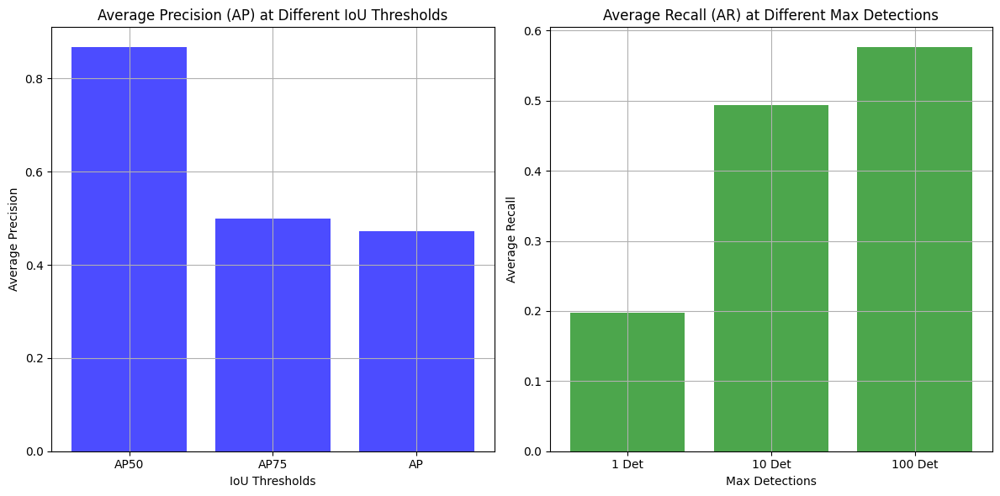

In [ ]:
# Example dictionary format (please adapt as necessary to fit your actual data format)
metrics = {
    'bbox': {
        'AP': 0.473,
        'AP50': 0.867,
        'AP75': 0.500,
        'AR1': 0.198,   # Assuming AR at maxDet=1
        'AR10': 0.494,  # Assuming AR at maxDet=10
        'AR100': 0.576  # Assuming AR at maxDet=100
    }
}

# Extracting values for plotting
iou_thresholds = ['AP50', 'AP75', 'AP']
precision_scores = [metrics['bbox'][key] for key in iou_thresholds]
recall_scores = [metrics['bbox'][f'AR{det}'] for det in ['1', '10', '100']]
max_dets_labels = ['1 Det', '10 Det', '100 Det']
import matplotlib.pyplot as plt

# Setting up the plot
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Bar plot for Precision (AP)
ax[0].bar(iou_thresholds, precision_scores, color='blue', alpha=0.7)
ax[0].set_title('Average Precision (AP) at Different IoU Thresholds')
ax[0].set_xlabel('IoU Thresholds')
ax[0].set_ylabel('Average Precision')
ax[0].grid(True)

# Bar plot for Recall (AR)
ax[1].bar(max_dets_labels, recall_scores, color='green', alpha=0.7)
ax[1].set_title('Average Recall (AR) at Different Max Detections')
ax[1].set_xlabel('Max Detections')
ax[1].set_ylabel('Average Recall')
ax[1].grid(True)

plt.tight_layout()
plt.show()



In [ ]:
from detectron2.config import get_cfg
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator
from detectron2.data import build_detection_test_loader, build_detection_train_loader
from detectron2 import model_zoo

def setup_config(optimizer_name='ADAM'):
    cfg = get_cfg()

    # Load model with weights
    base_model = "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
    cfg.merge_from_file(model_zoo.get_config_file(base_model))
    cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(base_model)

    # Define Datasets
    cfg.DATASETS.TRAIN = ("train",)
    cfg.DATASETS.TEST = ("test",)

    cfg.DATALOADER.NUM_WORKERS = 2
    cfg.SOLVER.IMS_PER_BATCH = 2
    cfg.SOLVER.BASE_LR = 0.001
    cfg.SOLVER.GAMMA = 0.05
    cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
    cfg.SOLVER.WARMUP_ITERS = 50
    cfg.SOLVER.MAX_ITER = 500
    cfg.TEST.EVAL_PERIOD = 100

    # Set number of classes
    cfg.MODEL.ROI_HEADS.NUM_CLASSES = 10
    cfg.MODEL.RETINANET.NUM_CLASSES = 10

    # Optimizer Configuration
    if optimizer_name == 'ADELTA':
        cfg.SOLVER.OPTIMIZER = "ADELTA"
        cfg.SOLVER.ADELTA_EPS = 1e-6
        cfg.SOLVER.ADELTA_RHO = 0.95
    elif optimizer_name == 'ADAM_SGD':
        cfg.SOLVER.OPTIMIZER = "ADAM"  # Using ADAM as a placeholder, adjust as needed
        cfg.SOLVER.BASE_LR = 0.001  # Consider hybrid behavior modifications
        cfg.SOLVER.MOMENTUM = 0.9
    elif optimizer_name == 'SGD_ADAM':
        cfg.SOLVER.OPTIMIZER = "SGD"  # Using SGD as a placeholder, adjust as needed
        cfg.SOLVER.MOMENTUM = 0.9
        cfg.SOLVER.NESTEROV = True

    cfg.OUTPUT_DIR = 'train_output_augmented'
    return cfg

# Example usage:
cfg = setup_config('SGD_ADAM')  # Choose 'ADELTA', 'ADAM_SGD', 'SGD_ADAM'


In [ ]:
class CustomTrainer(DefaultTrainer):
    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        if output_folder is None:
            os.makedirs("/kaggle/working/coco_eval_augmented", exist_ok=True)
            output_folder = "/kaggle/working/coco_eval_augmented"
        return COCOEvaluator(dataset_name, cfg, True, output_folder)

    @classmethod
    def build_train_loader(cls, cfg):
        return build_detection_train_loader(cfg, mapper=custom_mapper)



In [ ]:
trainer = CustomTrainer(cfg)
trainer.resume_or_load(resume=True)
trainer.train()

[05/05 15:14:26 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:14:29 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0033 s/iter. Inference: 0.1272 s/iter. Eval: 0.0267 s/iter. Total: 0.1573 s/iter. ETA=0:00:28
[05/05 15:14:34 d2.evaluation.evaluator]: Inference done 46/195. Dataloading: 0.0031 s/iter. Inference: 0.1208 s/iter. Eval: 0.0224 s/iter. Total: 0.1464 s/iter. ETA=0:00:21
[05/05 15:14:40 d2.evaluation.evaluator]: Inference done 77/195. Dataloading: 0.0036 s/iter. Inference: 0.1200 s/iter. Eval: 0.0321 s/iter. Total: 0.1558 s/iter. ETA=0:00:18
[05/05 15:14:45 d2.evaluation.evaluator]: Inference done 115/195. Dataloading: 0.0031 s/iter. Inference: 0.1157 s/iter. Eval: 0.0289 s/iter. Total: 0.1478 s/iter. ETA=0:00:11
[05/05 15:14:50 d2.evaluation.evaluator]: Inference done 150/195. Dataloading: 0.0034 s/iter. Inference: 0.1158 s/iter. Eval: 0.0284 s/iter. Total: 0.1476 s/iter. ETA=0:00:06
[05/05 15:14:55 d2.evaluation.evaluator]: Inference done 188/195. Dataloading: 0.0032 s/iter. Inference: 0.1144 s/iter. Eval: 0.

In [ ]:
cfg.MODEL.WEIGHTS = "/content/train_output_augmented/model_final.pth"
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("test", cfg, False, output_dir="./output_augmented/")
val_loader = build_detection_test_loader(cfg, "test")
print(inference_on_dataset(predictor.model, val_loader, evaluator))

# Evaluate on the test dataset
evaluator = CustomTrainer.build_evaluator(cfg, "test", "./output_augmented/")
test_loader = build_detection_test_loader(cfg, "test")
metrics = inference_on_dataset(trainer.model, test_loader, evaluator)
print(metrics)

[05/05 15:15:23 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/train_output_augmented/model_final.pth ...
WARNING [05/05 15:15:23 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[05/05 15:15:23 d2.data.datasets.coco]: Loaded 195 images in COCO format from /kaggle/input/nwpu-vhr-10/NWPU VHR-10/test/test.json
[05/05 15:15:23 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/05 15:15:23 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[05/05 15:15:23 d2.data.common]: Serializing 195 elements to byte tensors and concatenating them all ...
[05/05 15:15:23 d2.data.common]: Serialized dataset takes 0.12 MiB
[05/05 15:15:23 d2.evaluation.evaluator]: Start inference on 195 batches


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:15:25 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0053 s/iter. Inference: 0.1184 s/iter. Eval: 0.0239 s/iter. Total: 0.1476 s/iter. ETA=0:00:27
[05/05 15:15:30 d2.evaluation.evaluator]: Inference done 50/195. Dataloading: 0.0026 s/iter. Inference: 0.1105 s/iter. Eval: 0.0195 s/iter. Total: 0.1327 s/iter. ETA=0:00:19
[05/05 15:15:36 d2.evaluation.evaluator]: Inference done 83/195. Dataloading: 0.0025 s/iter. Inference: 0.1115 s/iter. Eval: 0.0267 s/iter. Total: 0.1409 s/iter. ETA=0:00:15
[05/05 15:15:41 d2.evaluation.evaluator]: Inference done 115/195. Dataloading: 0.0032 s/iter. Inference: 0.1141 s/iter. Eval: 0.0284 s/iter. Total: 0.1458 s/iter. ETA=0:00:11
[05/05 15:15:54 d2.evaluation.evaluator]: Inference done 127/195. Dataloading: 0.0034 s/iter. Inference: 0.2033 s/iter. Eval: 0.0309 s/iter. Total: 0.2378 s/iter. ETA=0:00:16
[05/05 15:15:59 d2.evaluation.evaluator]: Inference done 163/195. Dataloading: 0.0031 s/iter. Inference: 0.1830 s/iter. Eval: 0.

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:16:03 d2.evaluation.evaluator]: Total inference time: 0:00:38.699048 (0.203679 s / iter per device, on 1 devices)
[05/05 15:16:03 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:32 (0.171419 s / iter per device, on 1 devices)
[05/05 15:16:03 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/05 15:16:03 d2.evaluation.coco_evaluation]: Saving results to ./output_augmented/coco_instances_results.json
[05/05 15:16:03 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[05/05 15:16:03 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[05/05 15:16:03 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.09 seconds.
[05/05 15:16:03 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[05/05 15:16:03 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.03 seconds.
 Average Preci

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:16:06 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0017 s/iter. Inference: 0.1105 s/iter. Eval: 0.0218 s/iter. Total: 0.1341 s/iter. ETA=0:00:24
[05/05 15:16:11 d2.evaluation.evaluator]: Inference done 49/195. Dataloading: 0.0023 s/iter. Inference: 0.1110 s/iter. Eval: 0.0196 s/iter. Total: 0.1330 s/iter. ETA=0:00:19
[05/05 15:16:16 d2.evaluation.evaluator]: Inference done 79/195. Dataloading: 0.0030 s/iter. Inference: 0.1144 s/iter. Eval: 0.0307 s/iter. Total: 0.1483 s/iter. ETA=0:00:17
[05/05 15:16:21 d2.evaluation.evaluator]: Inference done 113/195. Dataloading: 0.0028 s/iter. Inference: 0.1154 s/iter. Eval: 0.0295 s/iter. Total: 0.1479 s/iter. ETA=0:00:12
[05/05 15:16:26 d2.evaluation.evaluator]: Inference done 147/195. Dataloading: 0.0031 s/iter. Inference: 0.1158 s/iter. Eval: 0.0289 s/iter. Total: 0.1480 s/iter. ETA=0:00:07
[05/05 15:16:31 d2.evaluation.evaluator]: Inference done 183/195. Dataloading: 0.0031 s/iter. Inference: 0.1151 s/iter. Eval: 0.

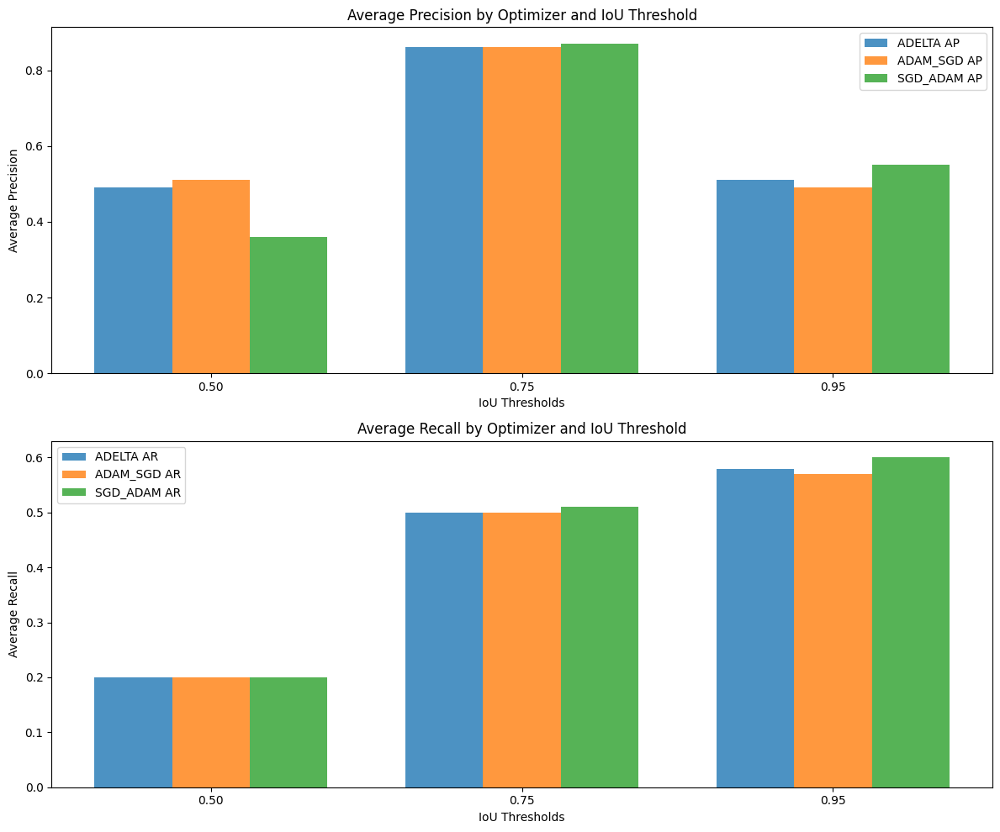

In [ ]:
performance_data = {
    'ADELTA': {
        'AP': [0.49, 0.86, 0.51],
        'AR': [0.20, 0.50, 0.58]
    },
    'ADAM_SGD': {
        'AP': [0.51, 0.86, 0.49],
        'AR': [0.20, 0.50, 0.57]
    },
    'SGD_ADAM': {
        'AP': [0.36, 0.87, 0.55],
        'AR': [0.20, 0.51, 0.60]
    }
}

iou_thresholds = ['0.50', '0.75', '0.95']  # Common IoU thresholds


import matplotlib.pyplot as plt
import numpy as np

# Setting for plots
n_groups = len(iou_thresholds)
index = np.arange(n_groups)
bar_width = 0.25
opacity = 0.8

fig, ax = plt.subplots(2, 1, figsize=(12, 10))  # Two subplots for AP and AR

# Plot Average Precision for each optimizer
for i, (opt_name, metrics) in enumerate(performance_data.items()):
    ax[0].bar(index + i * bar_width, metrics['AP'], bar_width, alpha=opacity, label=f'{opt_name} AP')

ax[0].set_xlabel('IoU Thresholds')
ax[0].set_ylabel('Average Precision')
ax[0].set_title('Average Precision by Optimizer and IoU Threshold')
ax[0].set_xticks(index + bar_width)
ax[0].set_xticklabels(iou_thresholds)
ax[0].legend()

# Plot Average Recall for each optimizer
for i, (opt_name, metrics) in enumerate(performance_data.items()):
    ax[1].bar(index + i * bar_width, metrics['AR'], bar_width, alpha=opacity, label=f'{opt_name} AR')

ax[1].set_xlabel('IoU Thresholds')
ax[1].set_ylabel('Average Recall')
ax[1].set_title('Average Recall by Optimizer and IoU Threshold')
ax[1].set_xticks(index + bar_width)
ax[1].set_xticklabels(iou_thresholds)
ax[1].legend()

plt.tight_layout()
plt.show()


In [ ]:
Fine_Tune

# Train with Resnet50 backbone

In [ ]:
cfg = get_cfg()

# Load model with weights
base_model = "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
cfg.merge_from_file(model_zoo.get_config_file(base_model))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(base_model)

# Define Datasets
cfg.DATASETS.TRAIN = ("train",)
cfg.DATASETS.TEST = ("test",)

cfg.DATALOADER.NUM_WORKERS = 2
cfg.SOLVER.IMS_PER_BATCH = 2

cfg.SOLVER.BASE_LR = 0.001
cfg.SOLVER.GAMMA = 0.05
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128

cfg.SOLVER.WARMUP_ITERS = 50
cfg.SOLVER.MAX_ITER = 1000 #Epochs
cfg.TEST.EVAL_PERIOD = 100

# Set number of classes
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 10
cfg.MODEL.RETINANET.NUM_CLASSES = 10

cfg.OUTPUT_DIR = 'train_output'

In [ ]:
cfg.MODEL.WEIGHTS = "/content/train_output_augmented/model_final.pth"
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "test")
print(inference_on_dataset(predictor.model, val_loader, evaluator))

[05/05 15:17:41 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/train_output_augmented/model_final.pth ...
WARNING [05/05 15:17:41 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[05/05 15:17:41 d2.data.datasets.coco]: Loaded 195 images in COCO format from /kaggle/input/nwpu-vhr-10/NWPU VHR-10/test/test.json
[05/05 15:17:41 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/05 15:17:41 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[05/05 15:17:41 d2.data.common]: Serializing 195 elements to byte tensors and concatenating them all ...
[05/05 15:17:41 d2.data.common]: Serialized dataset takes 0.12 MiB
[05/05 15:17:41 d2.evaluation.evaluator]: Start inference on 195 batches


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:17:43 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0018 s/iter. Inference: 0.1069 s/iter. Eval: 0.0064 s/iter. Total: 0.1151 s/iter. ETA=0:00:21
[05/05 15:17:48 d2.evaluation.evaluator]: Inference done 53/195. Dataloading: 0.0028 s/iter. Inference: 0.1086 s/iter. Eval: 0.0078 s/iter. Total: 0.1193 s/iter. ETA=0:00:16
[05/05 15:17:53 d2.evaluation.evaluator]: Inference done 90/195. Dataloading: 0.0033 s/iter. Inference: 0.1101 s/iter. Eval: 0.0132 s/iter. Total: 0.1268 s/iter. ETA=0:00:13
[05/05 15:17:58 d2.evaluation.evaluator]: Inference done 133/195. Dataloading: 0.0030 s/iter. Inference: 0.1094 s/iter. Eval: 0.0113 s/iter. Total: 0.1239 s/iter. ETA=0:00:07
[05/05 15:18:03 d2.evaluation.evaluator]: Inference done 173/195. Dataloading: 0.0032 s/iter. Inference: 0.1100 s/iter. Eval: 0.0112 s/iter. Total: 0.1246 s/iter. ETA=0:00:02
[05/05 15:18:06 d2.evaluation.evaluator]: Total inference time: 0:00:23.543310 (0.123912 s / iter per device, on 1 devices)
[05/

In [ ]:
class MyTrainer(DefaultTrainer):
    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        if output_folder is None:
            os.makedirs("/kaggle/working/coco_eval", exist_ok=True)
            output_folder = "/kaggle/working/coco_eval"
        return COCOEvaluator(dataset_name, cfg, True, output_folder)
    #CocoEvaluator extracts CocoMetrics based on the predictions of the model

In [ ]:
trainer = MyTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[05/05 15:18:37 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:18:48 d2.utils.events]:  eta: 0:08:31  iter: 19  total_loss: 0.883  loss_cls: 0.1729  loss_box_reg: 0.4137  loss_mask: 0.2248  loss_rpn_cls: 0.003677  loss_rpn_loc: 0.01901    time: 0.5137  last_time: 0.5404  data_time: 0.0280  last_data_time: 0.0058   lr: 0.00038062  max_mem: 5038M
[05/05 15:18:58 d2.utils.events]:  eta: 0:08:12  iter: 39  total_loss: 0.7122  loss_cls: 0.1063  loss_box_reg: 0.3469  loss_mask: 0.2089  loss_rpn_cls: 0.002156  loss_rpn_loc: 0.01679    time: 0.5088  last_time: 0.5176  data_time: 0.0121  last_data_time: 0.0137   lr: 0.00078022  max_mem: 5038M
[05/05 15:19:08 d2.utils.events]:  eta: 0:07:51  iter: 59  total_loss: 0.7224  loss_cls: 0.1139  loss_box_reg: 0.3689  loss_mask: 0.195  loss_rpn_cls: 0.003913  loss_rpn_loc: 0.01675    time: 0.5075  last_time: 0.5014  data_time: 0.0107  last_data_time: 0.0063   lr: 0.001  max_mem: 5038M
[05/05 15:19:18 d2.utils.events]:  eta: 0:07:40  iter: 79  total_loss: 0.7841  loss_cls: 0.1385  loss_box_reg: 0.4279  los

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:19:30 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0017 s/iter. Inference: 0.1152 s/iter. Eval: 0.0049 s/iter. Total: 0.1218 s/iter. ETA=0:00:22
[05/05 15:19:35 d2.evaluation.evaluator]: Inference done 53/195. Dataloading: 0.0021 s/iter. Inference: 0.1129 s/iter. Eval: 0.0069 s/iter. Total: 0.1220 s/iter. ETA=0:00:17
[05/05 15:19:40 d2.evaluation.evaluator]: Inference done 86/195. Dataloading: 0.0027 s/iter. Inference: 0.1184 s/iter. Eval: 0.0135 s/iter. Total: 0.1348 s/iter. ETA=0:00:14
[05/05 15:19:45 d2.evaluation.evaluator]: Inference done 126/195. Dataloading: 0.0026 s/iter. Inference: 0.1164 s/iter. Eval: 0.0129 s/iter. Total: 0.1320 s/iter. ETA=0:00:09
[05/05 15:19:50 d2.evaluation.evaluator]: Inference done 164/195. Dataloading: 0.0026 s/iter. Inference: 0.1169 s/iter. Eval: 0.0123 s/iter. Total: 0.1319 s/iter. ETA=0:00:04


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:19:54 d2.evaluation.evaluator]: Total inference time: 0:00:24.956929 (0.131352 s / iter per device, on 1 devices)
[05/05 15:19:54 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:22 (0.116852 s / iter per device, on 1 devices)
[05/05 15:19:54 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/05 15:19:54 d2.evaluation.coco_evaluation]: Saving results to /kaggle/working/coco_eval/coco_instances_results.json
[05/05 15:19:54 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[05/05 15:19:54 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[05/05 15:19:54 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.06 seconds.
[05/05 15:19:54 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[05/05 15:19:54 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.03 seconds.
 Averag

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:20:48 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0017 s/iter. Inference: 0.1172 s/iter. Eval: 0.0045 s/iter. Total: 0.1235 s/iter. ETA=0:00:22
[05/05 15:20:54 d2.evaluation.evaluator]: Inference done 47/195. Dataloading: 0.0038 s/iter. Inference: 0.1282 s/iter. Eval: 0.0069 s/iter. Total: 0.1391 s/iter. ETA=0:00:20
[05/05 15:20:59 d2.evaluation.evaluator]: Inference done 85/195. Dataloading: 0.0030 s/iter. Inference: 0.1230 s/iter. Eval: 0.0109 s/iter. Total: 0.1370 s/iter. ETA=0:00:15
[05/05 15:21:04 d2.evaluation.evaluator]: Inference done 122/195. Dataloading: 0.0031 s/iter. Inference: 0.1225 s/iter. Eval: 0.0112 s/iter. Total: 0.1369 s/iter. ETA=0:00:09
[05/05 15:21:09 d2.evaluation.evaluator]: Inference done 158/195. Dataloading: 0.0031 s/iter. Inference: 0.1233 s/iter. Eval: 0.0109 s/iter. Total: 0.1374 s/iter. ETA=0:00:05
[05/05 15:21:13 d2.evaluation.evaluator]: Total inference time: 0:00:25.583280 (0.134649 s / iter per device, on 1 devices)
[05/

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:22:08 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0017 s/iter. Inference: 0.1183 s/iter. Eval: 0.0045 s/iter. Total: 0.1245 s/iter. ETA=0:00:22
[05/05 15:22:13 d2.evaluation.evaluator]: Inference done 50/195. Dataloading: 0.0022 s/iter. Inference: 0.1192 s/iter. Eval: 0.0064 s/iter. Total: 0.1279 s/iter. ETA=0:00:18
[05/05 15:22:18 d2.evaluation.evaluator]: Inference done 84/195. Dataloading: 0.0027 s/iter. Inference: 0.1229 s/iter. Eval: 0.0109 s/iter. Total: 0.1366 s/iter. ETA=0:00:15
[05/05 15:22:23 d2.evaluation.evaluator]: Inference done 119/195. Dataloading: 0.0029 s/iter. Inference: 0.1252 s/iter. Eval: 0.0116 s/iter. Total: 0.1398 s/iter. ETA=0:00:10
[05/05 15:22:28 d2.evaluation.evaluator]: Inference done 154/195. Dataloading: 0.0031 s/iter. Inference: 0.1260 s/iter. Eval: 0.0116 s/iter. Total: 0.1409 s/iter. ETA=0:00:05
[05/05 15:22:33 d2.evaluation.evaluator]: Inference done 189/195. Dataloading: 0.0032 s/iter. Inference: 0.1272 s/iter. Eval: 0.

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:22:34 d2.evaluation.evaluator]: Total inference time: 0:00:26.835233 (0.141238 s / iter per device, on 1 devices)
[05/05 15:22:34 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:24 (0.126733 s / iter per device, on 1 devices)
[05/05 15:22:34 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/05 15:22:34 d2.evaluation.coco_evaluation]: Saving results to /kaggle/working/coco_eval/coco_instances_results.json
[05/05 15:22:34 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[05/05 15:22:34 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[05/05 15:22:34 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.05 seconds.
[05/05 15:22:34 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[05/05 15:22:34 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.02 seconds.
 Averag

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:23:31 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0040 s/iter. Inference: 0.1330 s/iter. Eval: 0.0062 s/iter. Total: 0.1432 s/iter. ETA=0:00:26
[05/05 15:23:36 d2.evaluation.evaluator]: Inference done 45/195. Dataloading: 0.0043 s/iter. Inference: 0.1356 s/iter. Eval: 0.0069 s/iter. Total: 0.1470 s/iter. ETA=0:00:22
[05/05 15:23:41 d2.evaluation.evaluator]: Inference done 80/195. Dataloading: 0.0033 s/iter. Inference: 0.1306 s/iter. Eval: 0.0110 s/iter. Total: 0.1451 s/iter. ETA=0:00:16
[05/05 15:23:46 d2.evaluation.evaluator]: Inference done 114/195. Dataloading: 0.0033 s/iter. Inference: 0.1321 s/iter. Eval: 0.0112 s/iter. Total: 0.1467 s/iter. ETA=0:00:11
[05/05 15:23:51 d2.evaluation.evaluator]: Inference done 153/195. Dataloading: 0.0030 s/iter. Inference: 0.1294 s/iter. Eval: 0.0105 s/iter. Total: 0.1430 s/iter. ETA=0:00:06
[05/05 15:23:56 d2.evaluation.evaluator]: Inference done 191/195. Dataloading: 0.0029 s/iter. Inference: 0.1280 s/iter. Eval: 0.

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:24:52 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0019 s/iter. Inference: 0.1229 s/iter. Eval: 0.0041 s/iter. Total: 0.1289 s/iter. ETA=0:00:23
[05/05 15:24:57 d2.evaluation.evaluator]: Inference done 49/195. Dataloading: 0.0024 s/iter. Inference: 0.1243 s/iter. Eval: 0.0061 s/iter. Total: 0.1330 s/iter. ETA=0:00:19
[05/05 15:25:02 d2.evaluation.evaluator]: Inference done 81/195. Dataloading: 0.0031 s/iter. Inference: 0.1292 s/iter. Eval: 0.0109 s/iter. Total: 0.1433 s/iter. ETA=0:00:16
[05/05 15:25:08 d2.evaluation.evaluator]: Inference done 119/195. Dataloading: 0.0028 s/iter. Inference: 0.1267 s/iter. Eval: 0.0106 s/iter. Total: 0.1402 s/iter. ETA=0:00:10
[05/05 15:25:13 d2.evaluation.evaluator]: Inference done 152/195. Dataloading: 0.0034 s/iter. Inference: 0.1293 s/iter. Eval: 0.0103 s/iter. Total: 0.1431 s/iter. ETA=0:00:06
[05/05 15:25:18 d2.evaluation.evaluator]: Inference done 190/195. Dataloading: 0.0032 s/iter. Inference: 0.1277 s/iter. Eval: 0.

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:26:15 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0017 s/iter. Inference: 0.1347 s/iter. Eval: 0.0044 s/iter. Total: 0.1408 s/iter. ETA=0:00:25
[05/05 15:26:20 d2.evaluation.evaluator]: Inference done 49/195. Dataloading: 0.0021 s/iter. Inference: 0.1249 s/iter. Eval: 0.0059 s/iter. Total: 0.1330 s/iter. ETA=0:00:19
[05/05 15:26:25 d2.evaluation.evaluator]: Inference done 84/195. Dataloading: 0.0024 s/iter. Inference: 0.1267 s/iter. Eval: 0.0103 s/iter. Total: 0.1395 s/iter. ETA=0:00:15
[05/05 15:26:30 d2.evaluation.evaluator]: Inference done 118/195. Dataloading: 0.0028 s/iter. Inference: 0.1282 s/iter. Eval: 0.0109 s/iter. Total: 0.1421 s/iter. ETA=0:00:10
[05/05 15:26:35 d2.evaluation.evaluator]: Inference done 155/195. Dataloading: 0.0026 s/iter. Inference: 0.1270 s/iter. Eval: 0.0107 s/iter. Total: 0.1405 s/iter. ETA=0:00:05
[05/05 15:26:40 d2.evaluation.evaluator]: Inference done 189/195. Dataloading: 0.0029 s/iter. Inference: 0.1288 s/iter. Eval: 0.

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:26:41 d2.evaluation.evaluator]: Total inference time: 0:00:26.942526 (0.141803 s / iter per device, on 1 devices)
[05/05 15:26:41 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:24 (0.128419 s / iter per device, on 1 devices)
[05/05 15:26:41 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/05 15:26:41 d2.evaluation.coco_evaluation]: Saving results to /kaggle/working/coco_eval/coco_instances_results.json
[05/05 15:26:41 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[05/05 15:26:41 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[05/05 15:26:41 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.39 seconds.
[05/05 15:26:41 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[05/05 15:26:41 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.03 seconds.
 Averag

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:27:36 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0019 s/iter. Inference: 0.1236 s/iter. Eval: 0.0042 s/iter. Total: 0.1296 s/iter. ETA=0:00:23
[05/05 15:27:41 d2.evaluation.evaluator]: Inference done 44/195. Dataloading: 0.0049 s/iter. Inference: 0.1375 s/iter. Eval: 0.0068 s/iter. Total: 0.1493 s/iter. ETA=0:00:22
[05/05 15:27:46 d2.evaluation.evaluator]: Inference done 68/195. Dataloading: 0.0056 s/iter. Inference: 0.1546 s/iter. Eval: 0.0122 s/iter. Total: 0.1725 s/iter. ETA=0:00:21
[05/05 15:27:52 d2.evaluation.evaluator]: Inference done 95/195. Dataloading: 0.0054 s/iter. Inference: 0.1607 s/iter. Eval: 0.0144 s/iter. Total: 0.1807 s/iter. ETA=0:00:18
[05/05 15:27:57 d2.evaluation.evaluator]: Inference done 112/195. Dataloading: 0.0055 s/iter. Inference: 0.1784 s/iter. Eval: 0.0154 s/iter. Total: 0.1998 s/iter. ETA=0:00:16
[05/05 15:28:02 d2.evaluation.evaluator]: Inference done 149/195. Dataloading: 0.0047 s/iter. Inference: 0.1650 s/iter. Eval: 0.0

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:29:05 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0055 s/iter. Inference: 0.1590 s/iter. Eval: 0.0064 s/iter. Total: 0.1709 s/iter. ETA=0:00:31
[05/05 15:29:10 d2.evaluation.evaluator]: Inference done 46/195. Dataloading: 0.0035 s/iter. Inference: 0.1378 s/iter. Eval: 0.0068 s/iter. Total: 0.1485 s/iter. ETA=0:00:22
[05/05 15:29:15 d2.evaluation.evaluator]: Inference done 81/195. Dataloading: 0.0031 s/iter. Inference: 0.1327 s/iter. Eval: 0.0105 s/iter. Total: 0.1465 s/iter. ETA=0:00:16
[05/05 15:29:20 d2.evaluation.evaluator]: Inference done 112/195. Dataloading: 0.0034 s/iter. Inference: 0.1364 s/iter. Eval: 0.0110 s/iter. Total: 0.1510 s/iter. ETA=0:00:12
[05/05 15:29:25 d2.evaluation.evaluator]: Inference done 150/195. Dataloading: 0.0030 s/iter. Inference: 0.1334 s/iter. Eval: 0.0101 s/iter. Total: 0.1468 s/iter. ETA=0:00:06
[05/05 15:29:30 d2.evaluation.evaluator]: Inference done 186/195. Dataloading: 0.0031 s/iter. Inference: 0.1327 s/iter. Eval: 0.

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:30:28 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0017 s/iter. Inference: 0.1245 s/iter. Eval: 0.0038 s/iter. Total: 0.1299 s/iter. ETA=0:00:23
[05/05 15:30:33 d2.evaluation.evaluator]: Inference done 45/195. Dataloading: 0.0041 s/iter. Inference: 0.1371 s/iter. Eval: 0.0060 s/iter. Total: 0.1473 s/iter. ETA=0:00:22
[05/05 15:30:38 d2.evaluation.evaluator]: Inference done 81/195. Dataloading: 0.0032 s/iter. Inference: 0.1316 s/iter. Eval: 0.0101 s/iter. Total: 0.1450 s/iter. ETA=0:00:16
[05/05 15:30:43 d2.evaluation.evaluator]: Inference done 118/195. Dataloading: 0.0031 s/iter. Inference: 0.1293 s/iter. Eval: 0.0101 s/iter. Total: 0.1426 s/iter. ETA=0:00:10
[05/05 15:30:48 d2.evaluation.evaluator]: Inference done 152/195. Dataloading: 0.0031 s/iter. Inference: 0.1308 s/iter. Eval: 0.0096 s/iter. Total: 0.1437 s/iter. ETA=0:00:06
[05/05 15:30:53 d2.evaluation.evaluator]: Inference done 190/195. Dataloading: 0.0029 s/iter. Inference: 0.1294 s/iter. Eval: 0.

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:31:54 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0017 s/iter. Inference: 0.1240 s/iter. Eval: 0.0041 s/iter. Total: 0.1297 s/iter. ETA=0:00:23
[05/05 15:31:59 d2.evaluation.evaluator]: Inference done 44/195. Dataloading: 0.0040 s/iter. Inference: 0.1402 s/iter. Eval: 0.0065 s/iter. Total: 0.1509 s/iter. ETA=0:00:22
[05/05 15:32:04 d2.evaluation.evaluator]: Inference done 78/195. Dataloading: 0.0032 s/iter. Inference: 0.1356 s/iter. Eval: 0.0110 s/iter. Total: 0.1498 s/iter. ETA=0:00:17
[05/05 15:32:09 d2.evaluation.evaluator]: Inference done 113/195. Dataloading: 0.0028 s/iter. Inference: 0.1342 s/iter. Eval: 0.0108 s/iter. Total: 0.1479 s/iter. ETA=0:00:12
[05/05 15:32:14 d2.evaluation.evaluator]: Inference done 146/195. Dataloading: 0.0031 s/iter. Inference: 0.1360 s/iter. Eval: 0.0105 s/iter. Total: 0.1497 s/iter. ETA=0:00:07
[05/05 15:32:19 d2.evaluation.evaluator]: Inference done 182/195. Dataloading: 0.0030 s/iter. Inference: 0.1343 s/iter. Eval: 0.

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:32:21 d2.evaluation.evaluator]: Total inference time: 0:00:28.066299 (0.147717 s / iter per device, on 1 devices)
[05/05 15:32:21 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:25 (0.133924 s / iter per device, on 1 devices)
[05/05 15:32:21 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/05 15:32:21 d2.evaluation.coco_evaluation]: Saving results to /kaggle/working/coco_eval/coco_instances_results.json
[05/05 15:32:21 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
[05/05 15:32:21 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[05/05 15:32:22 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.07 seconds.
[05/05 15:32:22 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[05/05 15:32:22 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.04 seconds.
 Averag

In [ ]:
cfg.MODEL.WEIGHTS = "/content/train_output/model_final.pth"
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "test")
print(inference_on_dataset(predictor.model, val_loader, evaluator))

[05/05 15:33:59 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/train_output/model_final.pth ...
WARNING [05/05 15:33:59 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[05/05 15:33:59 d2.data.datasets.coco]: Loaded 195 images in COCO format from /kaggle/input/nwpu-vhr-10/NWPU VHR-10/test/test.json
[05/05 15:33:59 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/05 15:33:59 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[05/05 15:33:59 d2.data.common]: Serializing 195 elements to byte tensors and concatenating them all ...
[05/05 15:33:59 d2.data.common]: Serialized dataset takes 0.12 MiB
[05/05 15:33:59 d2.evaluation.evaluator]: Start inference on 195 batches


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:34:01 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0018 s/iter. Inference: 0.1295 s/iter. Eval: 0.0045 s/iter. Total: 0.1358 s/iter. ETA=0:00:24
[05/05 15:34:06 d2.evaluation.evaluator]: Inference done 45/195. Dataloading: 0.0031 s/iter. Inference: 0.1374 s/iter. Eval: 0.0068 s/iter. Total: 0.1474 s/iter. ETA=0:00:22
[05/05 15:34:11 d2.evaluation.evaluator]: Inference done 78/195. Dataloading: 0.0029 s/iter. Inference: 0.1361 s/iter. Eval: 0.0113 s/iter. Total: 0.1504 s/iter. ETA=0:00:17
[05/05 15:34:16 d2.evaluation.evaluator]: Inference done 115/195. Dataloading: 0.0026 s/iter. Inference: 0.1328 s/iter. Eval: 0.0107 s/iter. Total: 0.1464 s/iter. ETA=0:00:11
[05/05 15:34:22 d2.evaluation.evaluator]: Inference done 147/195. Dataloading: 0.0031 s/iter. Inference: 0.1356 s/iter. Eval: 0.0104 s/iter. Total: 0.1493 s/iter. ETA=0:00:07
[05/05 15:34:27 d2.evaluation.evaluator]: Inference done 184/195. Dataloading: 0.0030 s/iter. Inference: 0.1338 s/iter. Eval: 0.

In [ ]:
trainer = MyTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[05/05 15:35:29 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:35:40 d2.utils.events]:  eta: 0:08:04  iter: 19  total_loss: 0.588  loss_cls: 0.09666  loss_box_reg: 0.2919  loss_mask: 0.1628  loss_rpn_cls: 0.001181  loss_rpn_loc: 0.0155    time: 0.5039  last_time: 0.6057  data_time: 0.0247  last_data_time: 0.0241   lr: 0.00038062  max_mem: 5038M
[05/05 15:35:53 d2.utils.events]:  eta: 0:09:13  iter: 39  total_loss: 0.5824  loss_cls: 0.08938  loss_box_reg: 0.2765  loss_mask: 0.1516  loss_rpn_cls: 0.001252  loss_rpn_loc: 0.01219    time: 0.5929  last_time: 0.6245  data_time: 0.0206  last_data_time: 0.0255   lr: 0.00078022  max_mem: 5038M
[05/05 15:36:04 d2.utils.events]:  eta: 0:08:51  iter: 59  total_loss: 0.5749  loss_cls: 0.09722  loss_box_reg: 0.29  loss_mask: 0.1619  loss_rpn_cls: 0.0008065  loss_rpn_loc: 0.01081    time: 0.5798  last_time: 0.4859  data_time: 0.0126  last_data_time: 0.0094   lr: 0.001  max_mem: 5038M
[05/05 15:36:15 d2.utils.events]:  eta: 0:08:31  iter: 79  total_loss: 0.5699  loss_cls: 0.0812  loss_box_reg: 0.2847  l

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:36:29 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0086 s/iter. Inference: 0.1838 s/iter. Eval: 0.0068 s/iter. Total: 0.1993 s/iter. ETA=0:00:36
[05/05 15:36:34 d2.evaluation.evaluator]: Inference done 47/195. Dataloading: 0.0034 s/iter. Inference: 0.1394 s/iter. Eval: 0.0065 s/iter. Total: 0.1494 s/iter. ETA=0:00:22
[05/05 15:36:39 d2.evaluation.evaluator]: Inference done 81/195. Dataloading: 0.0029 s/iter. Inference: 0.1358 s/iter. Eval: 0.0107 s/iter. Total: 0.1495 s/iter. ETA=0:00:17
[05/05 15:36:44 d2.evaluation.evaluator]: Inference done 113/195. Dataloading: 0.0030 s/iter. Inference: 0.1380 s/iter. Eval: 0.0113 s/iter. Total: 0.1525 s/iter. ETA=0:00:12
[05/05 15:36:49 d2.evaluation.evaluator]: Inference done 147/195. Dataloading: 0.0030 s/iter. Inference: 0.1379 s/iter. Eval: 0.0109 s/iter. Total: 0.1519 s/iter. ETA=0:00:07
[05/05 15:36:54 d2.evaluation.evaluator]: Inference done 178/195. Dataloading: 0.0033 s/iter. Inference: 0.1402 s/iter. Eval: 0.

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:37:54 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0060 s/iter. Inference: 0.1724 s/iter. Eval: 0.0071 s/iter. Total: 0.1855 s/iter. ETA=0:00:34
[05/05 15:37:59 d2.evaluation.evaluator]: Inference done 46/195. Dataloading: 0.0033 s/iter. Inference: 0.1400 s/iter. Eval: 0.0064 s/iter. Total: 0.1499 s/iter. ETA=0:00:22
[05/05 15:38:05 d2.evaluation.evaluator]: Inference done 80/195. Dataloading: 0.0028 s/iter. Inference: 0.1363 s/iter. Eval: 0.0108 s/iter. Total: 0.1500 s/iter. ETA=0:00:17
[05/05 15:38:10 d2.evaluation.evaluator]: Inference done 112/195. Dataloading: 0.0031 s/iter. Inference: 0.1382 s/iter. Eval: 0.0111 s/iter. Total: 0.1525 s/iter. ETA=0:00:12
[05/05 15:38:15 d2.evaluation.evaluator]: Inference done 148/195. Dataloading: 0.0029 s/iter. Inference: 0.1360 s/iter. Eval: 0.0103 s/iter. Total: 0.1493 s/iter. ETA=0:00:07
[05/05 15:38:20 d2.evaluation.evaluator]: Inference done 180/195. Dataloading: 0.0031 s/iter. Inference: 0.1374 s/iter. Eval: 0.

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:38:22 d2.evaluation.evaluator]: Total inference time: 0:00:28.561525 (0.150324 s / iter per device, on 1 devices)
[05/05 15:38:22 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:25 (0.136787 s / iter per device, on 1 devices)
[05/05 15:38:22 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/05 15:38:22 d2.evaluation.coco_evaluation]: Saving results to /kaggle/working/coco_eval/coco_instances_results.json
[05/05 15:38:22 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[05/05 15:38:22 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[05/05 15:38:22 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.05 seconds.
[05/05 15:38:22 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[05/05 15:38:22 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.03 seconds.
 Averag

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:39:19 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0017 s/iter. Inference: 0.1290 s/iter. Eval: 0.0037 s/iter. Total: 0.1344 s/iter. ETA=0:00:24
[05/05 15:39:24 d2.evaluation.evaluator]: Inference done 44/195. Dataloading: 0.0039 s/iter. Inference: 0.1425 s/iter. Eval: 0.0062 s/iter. Total: 0.1527 s/iter. ETA=0:00:23
[05/05 15:39:29 d2.evaluation.evaluator]: Inference done 78/195. Dataloading: 0.0032 s/iter. Inference: 0.1376 s/iter. Eval: 0.0108 s/iter. Total: 0.1516 s/iter. ETA=0:00:17
[05/05 15:39:34 d2.evaluation.evaluator]: Inference done 109/195. Dataloading: 0.0033 s/iter. Inference: 0.1407 s/iter. Eval: 0.0107 s/iter. Total: 0.1548 s/iter. ETA=0:00:13
[05/05 15:39:39 d2.evaluation.evaluator]: Inference done 145/195. Dataloading: 0.0031 s/iter. Inference: 0.1381 s/iter. Eval: 0.0100 s/iter. Total: 0.1513 s/iter. ETA=0:00:07
[05/05 15:39:44 d2.evaluation.evaluator]: Inference done 180/195. Dataloading: 0.0029 s/iter. Inference: 0.1367 s/iter. Eval: 0.

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:40:45 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0017 s/iter. Inference: 0.1308 s/iter. Eval: 0.0046 s/iter. Total: 0.1370 s/iter. ETA=0:00:25
[05/05 15:40:50 d2.evaluation.evaluator]: Inference done 43/195. Dataloading: 0.0034 s/iter. Inference: 0.1435 s/iter. Eval: 0.0067 s/iter. Total: 0.1537 s/iter. ETA=0:00:23
[05/05 15:40:55 d2.evaluation.evaluator]: Inference done 77/195. Dataloading: 0.0028 s/iter. Inference: 0.1380 s/iter. Eval: 0.0110 s/iter. Total: 0.1519 s/iter. ETA=0:00:17
[05/05 15:41:00 d2.evaluation.evaluator]: Inference done 107/195. Dataloading: 0.0034 s/iter. Inference: 0.1454 s/iter. Eval: 0.0111 s/iter. Total: 0.1600 s/iter. ETA=0:00:14
[05/05 15:41:05 d2.evaluation.evaluator]: Inference done 143/195. Dataloading: 0.0030 s/iter. Inference: 0.1415 s/iter. Eval: 0.0102 s/iter. Total: 0.1549 s/iter. ETA=0:00:08
[05/05 15:41:10 d2.evaluation.evaluator]: Inference done 178/195. Dataloading: 0.0030 s/iter. Inference: 0.1399 s/iter. Eval: 0.

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:42:11 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0018 s/iter. Inference: 0.1365 s/iter. Eval: 0.0053 s/iter. Total: 0.1435 s/iter. ETA=0:00:26
[05/05 15:42:16 d2.evaluation.evaluator]: Inference done 44/195. Dataloading: 0.0033 s/iter. Inference: 0.1431 s/iter. Eval: 0.0070 s/iter. Total: 0.1536 s/iter. ETA=0:00:23
[05/05 15:42:21 d2.evaluation.evaluator]: Inference done 77/195. Dataloading: 0.0029 s/iter. Inference: 0.1399 s/iter. Eval: 0.0112 s/iter. Total: 0.1541 s/iter. ETA=0:00:18
[05/05 15:42:26 d2.evaluation.evaluator]: Inference done 108/195. Dataloading: 0.0034 s/iter. Inference: 0.1425 s/iter. Eval: 0.0112 s/iter. Total: 0.1572 s/iter. ETA=0:00:13
[05/05 15:42:31 d2.evaluation.evaluator]: Inference done 144/195. Dataloading: 0.0031 s/iter. Inference: 0.1395 s/iter. Eval: 0.0103 s/iter. Total: 0.1530 s/iter. ETA=0:00:07
[05/05 15:42:36 d2.evaluation.evaluator]: Inference done 179/195. Dataloading: 0.0030 s/iter. Inference: 0.1387 s/iter. Eval: 0.

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:43:36 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0023 s/iter. Inference: 0.1302 s/iter. Eval: 0.0042 s/iter. Total: 0.1367 s/iter. ETA=0:00:25
[05/05 15:43:41 d2.evaluation.evaluator]: Inference done 43/195. Dataloading: 0.0040 s/iter. Inference: 0.1453 s/iter. Eval: 0.0063 s/iter. Total: 0.1558 s/iter. ETA=0:00:23
[05/05 15:43:46 d2.evaluation.evaluator]: Inference done 76/195. Dataloading: 0.0032 s/iter. Inference: 0.1402 s/iter. Eval: 0.0107 s/iter. Total: 0.1542 s/iter. ETA=0:00:18
[05/05 15:43:51 d2.evaluation.evaluator]: Inference done 107/195. Dataloading: 0.0036 s/iter. Inference: 0.1428 s/iter. Eval: 0.0108 s/iter. Total: 0.1574 s/iter. ETA=0:00:13
[05/05 15:43:56 d2.evaluation.evaluator]: Inference done 143/195. Dataloading: 0.0033 s/iter. Inference: 0.1401 s/iter. Eval: 0.0100 s/iter. Total: 0.1535 s/iter. ETA=0:00:07
[05/05 15:44:01 d2.evaluation.evaluator]: Inference done 174/195. Dataloading: 0.0035 s/iter. Inference: 0.1413 s/iter. Eval: 0.

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:45:02 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0017 s/iter. Inference: 0.1317 s/iter. Eval: 0.0039 s/iter. Total: 0.1373 s/iter. ETA=0:00:25
[05/05 15:45:07 d2.evaluation.evaluator]: Inference done 42/195. Dataloading: 0.0042 s/iter. Inference: 0.1473 s/iter. Eval: 0.0061 s/iter. Total: 0.1577 s/iter. ETA=0:00:24
[05/05 15:45:12 d2.evaluation.evaluator]: Inference done 76/195. Dataloading: 0.0033 s/iter. Inference: 0.1404 s/iter. Eval: 0.0103 s/iter. Total: 0.1541 s/iter. ETA=0:00:18
[05/05 15:45:17 d2.evaluation.evaluator]: Inference done 107/195. Dataloading: 0.0036 s/iter. Inference: 0.1428 s/iter. Eval: 0.0106 s/iter. Total: 0.1571 s/iter. ETA=0:00:13
[05/05 15:45:22 d2.evaluation.evaluator]: Inference done 143/195. Dataloading: 0.0034 s/iter. Inference: 0.1396 s/iter. Eval: 0.0098 s/iter. Total: 0.1528 s/iter. ETA=0:00:07
[05/05 15:45:28 d2.evaluation.evaluator]: Inference done 178/195. Dataloading: 0.0032 s/iter. Inference: 0.1383 s/iter. Eval: 0.

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:46:27 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0017 s/iter. Inference: 0.1357 s/iter. Eval: 0.0037 s/iter. Total: 0.1411 s/iter. ETA=0:00:25
[05/05 15:46:33 d2.evaluation.evaluator]: Inference done 43/195. Dataloading: 0.0033 s/iter. Inference: 0.1463 s/iter. Eval: 0.0066 s/iter. Total: 0.1563 s/iter. ETA=0:00:23
[05/05 15:46:38 d2.evaluation.evaluator]: Inference done 77/195. Dataloading: 0.0028 s/iter. Inference: 0.1399 s/iter. Eval: 0.0110 s/iter. Total: 0.1538 s/iter. ETA=0:00:18
[05/05 15:46:43 d2.evaluation.evaluator]: Inference done 108/195. Dataloading: 0.0032 s/iter. Inference: 0.1425 s/iter. Eval: 0.0109 s/iter. Total: 0.1567 s/iter. ETA=0:00:13
[05/05 15:46:48 d2.evaluation.evaluator]: Inference done 144/195. Dataloading: 0.0029 s/iter. Inference: 0.1390 s/iter. Eval: 0.0100 s/iter. Total: 0.1521 s/iter. ETA=0:00:07
[05/05 15:46:53 d2.evaluation.evaluator]: Inference done 180/195. Dataloading: 0.0028 s/iter. Inference: 0.1374 s/iter. Eval: 0.

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:47:52 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0019 s/iter. Inference: 0.1334 s/iter. Eval: 0.0044 s/iter. Total: 0.1397 s/iter. ETA=0:00:25
[05/05 15:47:57 d2.evaluation.evaluator]: Inference done 42/195. Dataloading: 0.0033 s/iter. Inference: 0.1481 s/iter. Eval: 0.0073 s/iter. Total: 0.1588 s/iter. ETA=0:00:24
[05/05 15:48:02 d2.evaluation.evaluator]: Inference done 68/195. Dataloading: 0.0043 s/iter. Inference: 0.1558 s/iter. Eval: 0.0125 s/iter. Total: 0.1727 s/iter. ETA=0:00:21
[05/05 15:48:08 d2.evaluation.evaluator]: Inference done 101/195. Dataloading: 0.0037 s/iter. Inference: 0.1496 s/iter. Eval: 0.0126 s/iter. Total: 0.1661 s/iter. ETA=0:00:15
[05/05 15:48:13 d2.evaluation.evaluator]: Inference done 135/195. Dataloading: 0.0035 s/iter. Inference: 0.1469 s/iter. Eval: 0.0114 s/iter. Total: 0.1620 s/iter. ETA=0:00:09
[05/05 15:48:18 d2.evaluation.evaluator]: Inference done 171/195. Dataloading: 0.0032 s/iter. Inference: 0.1433 s/iter. Eval: 0.

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:49:25 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0018 s/iter. Inference: 0.1313 s/iter. Eval: 0.0045 s/iter. Total: 0.1375 s/iter. ETA=0:00:25
[05/05 15:49:30 d2.evaluation.evaluator]: Inference done 47/195. Dataloading: 0.0022 s/iter. Inference: 0.1305 s/iter. Eval: 0.0062 s/iter. Total: 0.1390 s/iter. ETA=0:00:20
[05/05 15:49:35 d2.evaluation.evaluator]: Inference done 76/195. Dataloading: 0.0029 s/iter. Inference: 0.1393 s/iter. Eval: 0.0121 s/iter. Total: 0.1544 s/iter. ETA=0:00:18
[05/05 15:49:40 d2.evaluation.evaluator]: Inference done 111/195. Dataloading: 0.0027 s/iter. Inference: 0.1367 s/iter. Eval: 0.0114 s/iter. Total: 0.1508 s/iter. ETA=0:00:12
[05/05 15:49:45 d2.evaluation.evaluator]: Inference done 145/195. Dataloading: 0.0028 s/iter. Inference: 0.1368 s/iter. Eval: 0.0108 s/iter. Total: 0.1505 s/iter. ETA=0:00:07
[05/05 15:49:50 d2.evaluation.evaluator]: Inference done 178/195. Dataloading: 0.0029 s/iter. Inference: 0.1377 s/iter. Eval: 0.

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:49:52 d2.evaluation.evaluator]: Total inference time: 0:00:28.599149 (0.150522 s / iter per device, on 1 devices)
[05/05 15:49:52 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:25 (0.136837 s / iter per device, on 1 devices)
[05/05 15:49:52 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/05 15:49:52 d2.evaluation.coco_evaluation]: Saving results to /kaggle/working/coco_eval/coco_instances_results.json
[05/05 15:49:52 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[05/05 15:49:52 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[05/05 15:49:53 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.04 seconds.
[05/05 15:49:53 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[05/05 15:49:53 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.02 seconds.
 Averag

In [ ]:
cfg.MODEL.WEIGHTS = "/content/train_output/model_final.pth"
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "test")
print(inference_on_dataset(predictor.model, val_loader, evaluator))

[05/05 15:50:07 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/train_output/model_final.pth ...
WARNING [05/05 15:50:07 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[05/05 15:50:07 d2.data.datasets.coco]: Loaded 195 images in COCO format from /kaggle/input/nwpu-vhr-10/NWPU VHR-10/test/test.json
[05/05 15:50:07 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/05 15:50:07 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[05/05 15:50:07 d2.data.common]: Serializing 195 elements to byte tensors and concatenating them all ...
[05/05 15:50:07 d2.data.common]: Serialized dataset takes 0.12 MiB
[05/05 15:50:07 d2.evaluation.evaluator]: Start inference on 195 batches


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/05 15:50:10 d2.evaluation.evaluator]: Inference done 11/195. Dataloading: 0.0053 s/iter. Inference: 0.1847 s/iter. Eval: 0.0070 s/iter. Total: 0.1969 s/iter. ETA=0:00:36
[05/05 15:50:15 d2.evaluation.evaluator]: Inference done 47/195. Dataloading: 0.0026 s/iter. Inference: 0.1407 s/iter. Eval: 0.0063 s/iter. Total: 0.1498 s/iter. ETA=0:00:22
[05/05 15:50:20 d2.evaluation.evaluator]: Inference done 80/195. Dataloading: 0.0025 s/iter. Inference: 0.1386 s/iter. Eval: 0.0108 s/iter. Total: 0.1520 s/iter. ETA=0:00:17
[05/05 15:50:25 d2.evaluation.evaluator]: Inference done 111/195. Dataloading: 0.0028 s/iter. Inference: 0.1408 s/iter. Eval: 0.0114 s/iter. Total: 0.1551 s/iter. ETA=0:00:13
[05/05 15:50:30 d2.evaluation.evaluator]: Inference done 147/195. Dataloading: 0.0026 s/iter. Inference: 0.1387 s/iter. Eval: 0.0106 s/iter. Total: 0.1521 s/iter. ETA=0:00:07
[05/05 15:50:35 d2.evaluation.evaluator]: Inference done 178/195. Dataloading: 0.0029 s/iter. Inference: 0.1405 s/iter. Eval: 0.

In [ ]:
import json
with open('/kaggle/input/nwpu-vhr-10/NWPU VHR-10/test/test.json') as f:
    test_anns = json.load(f)
test_imgs = [img['file_name'] for img in test_anns['images']]

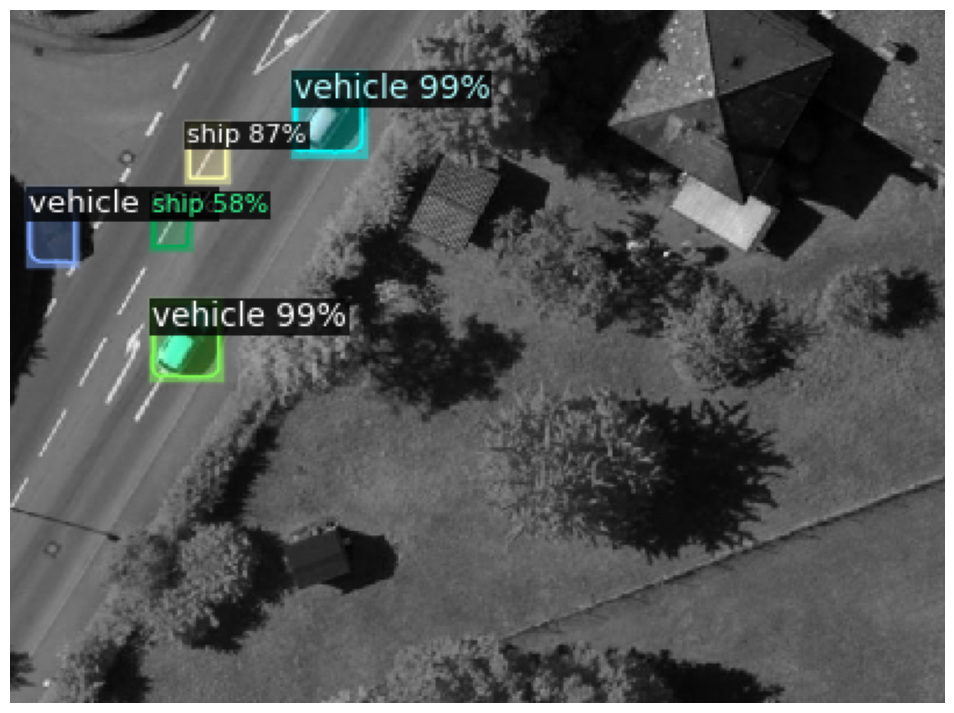

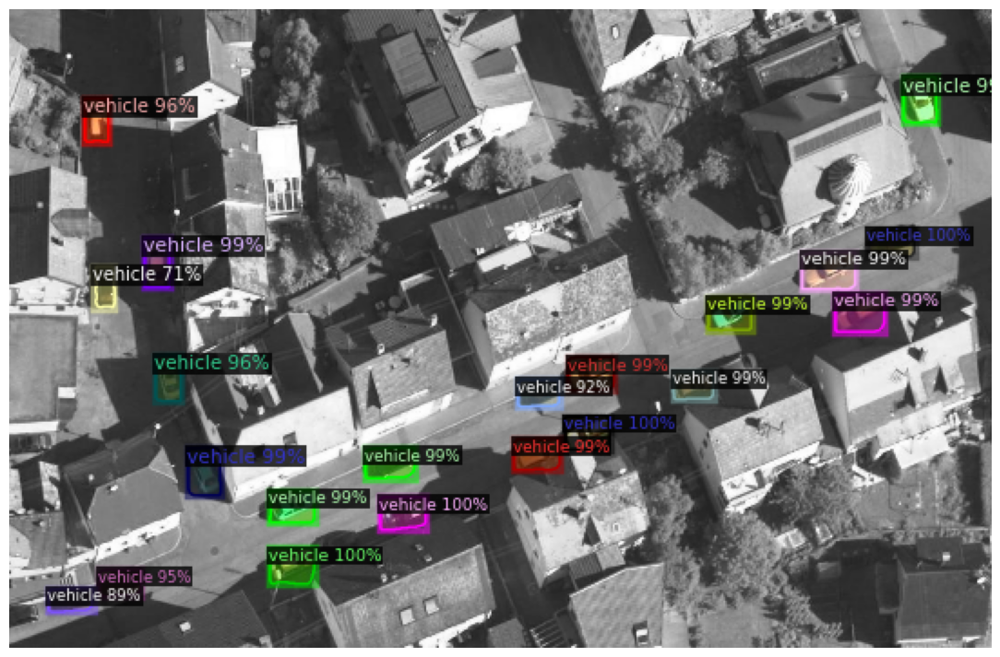

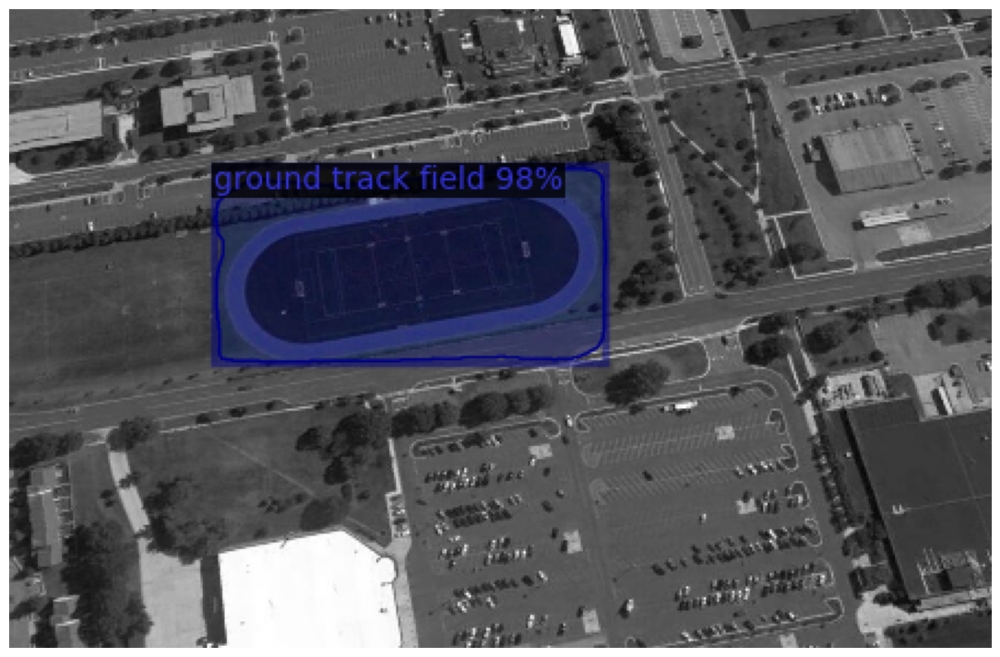

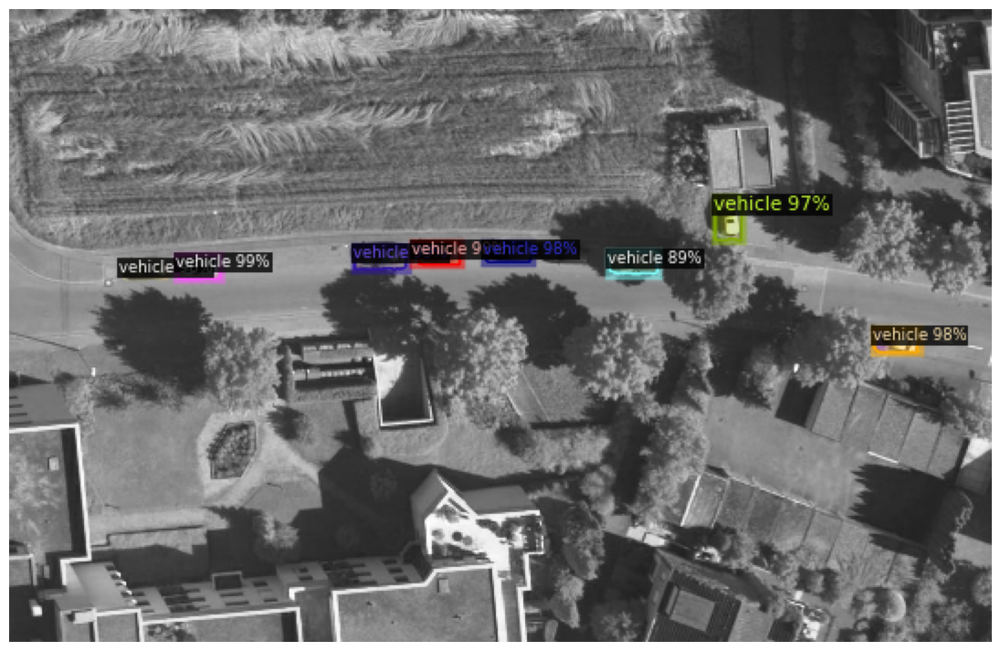

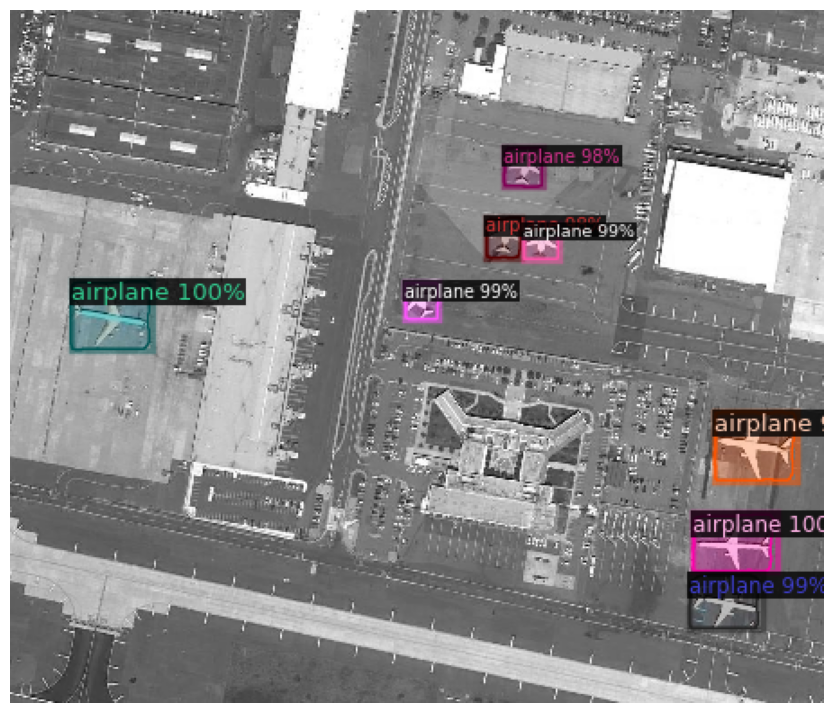

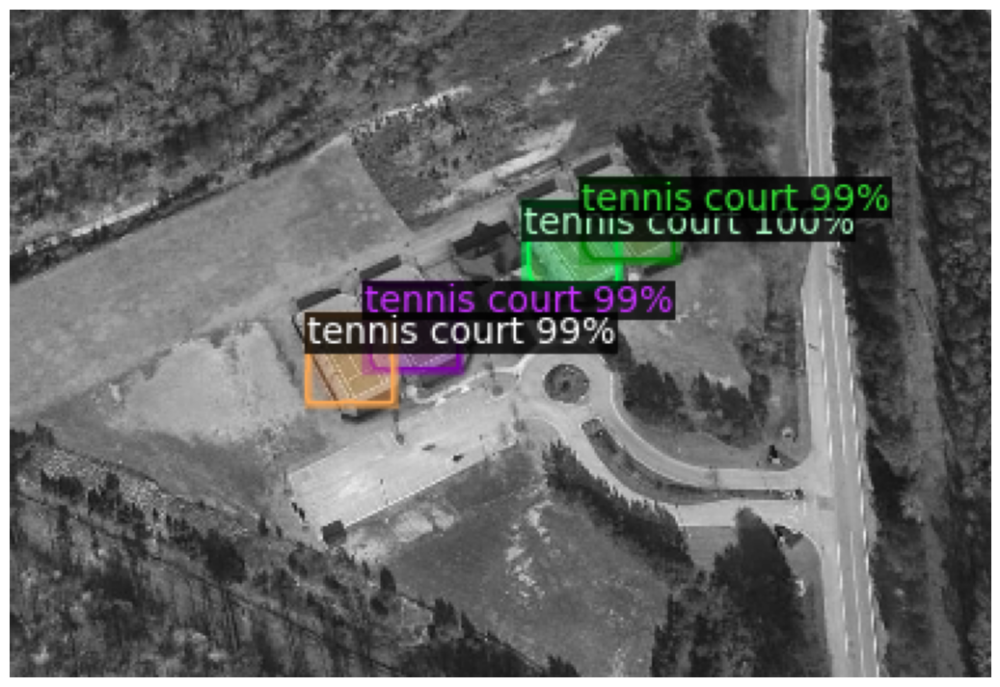

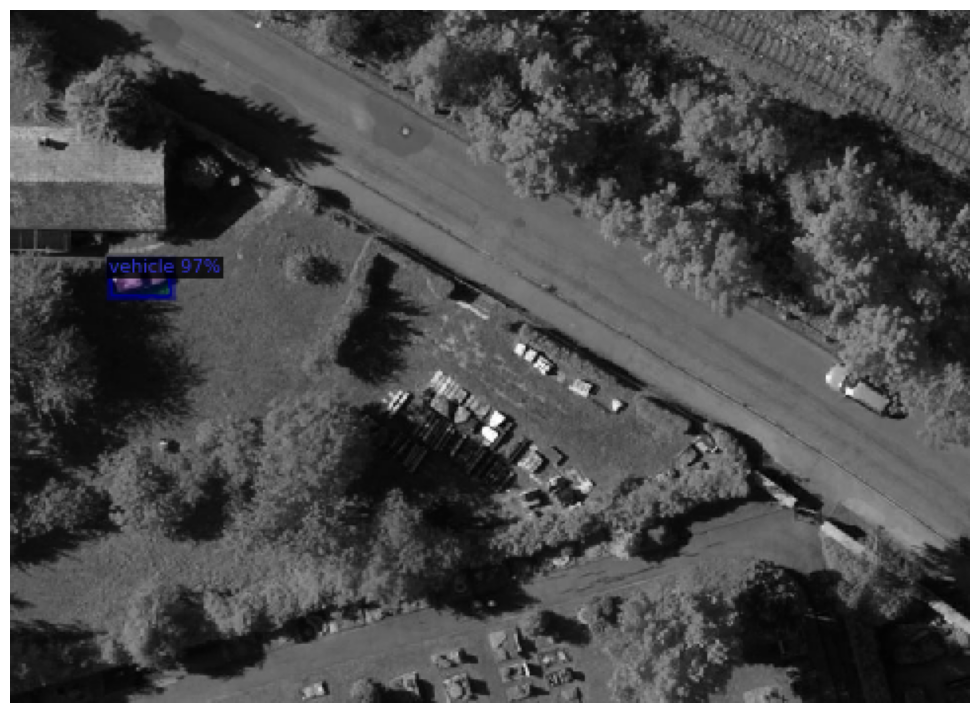

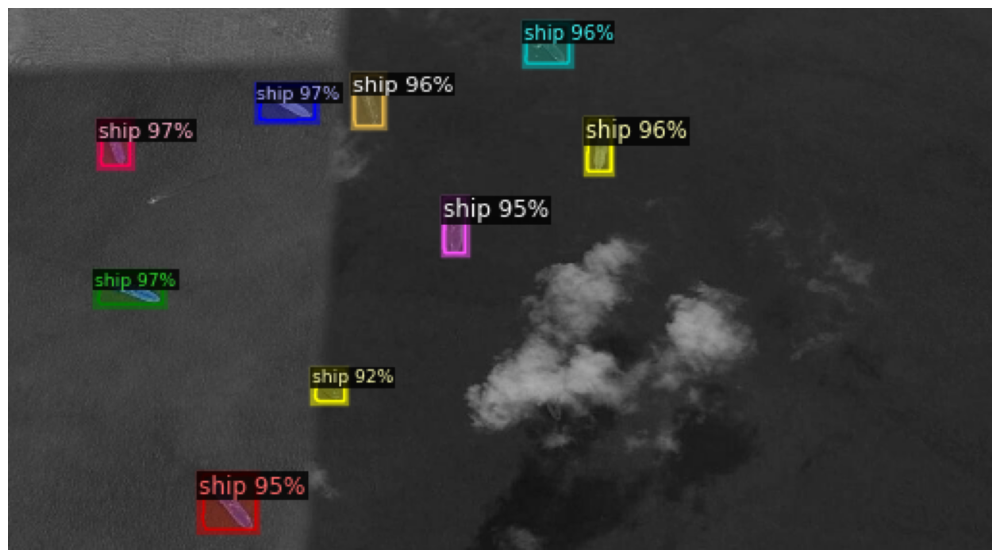

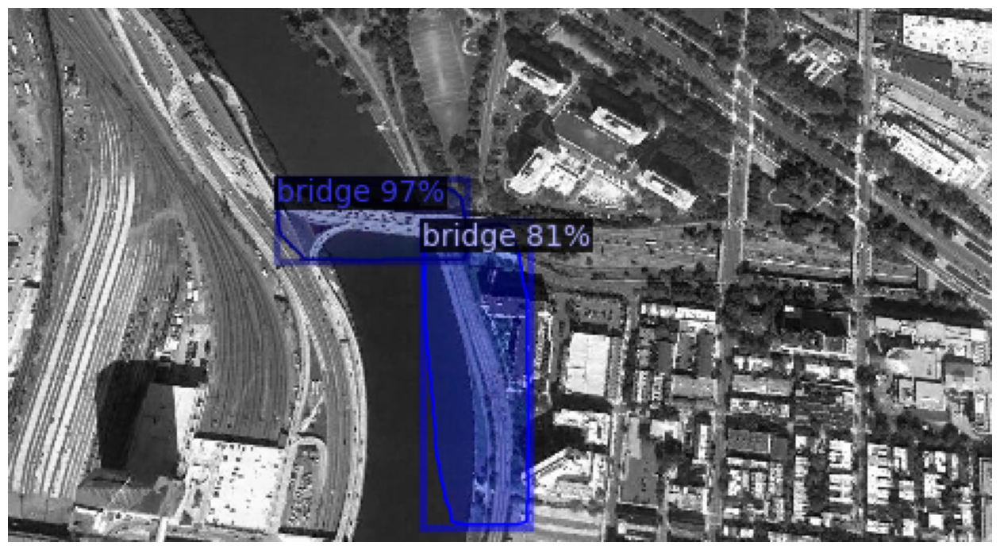

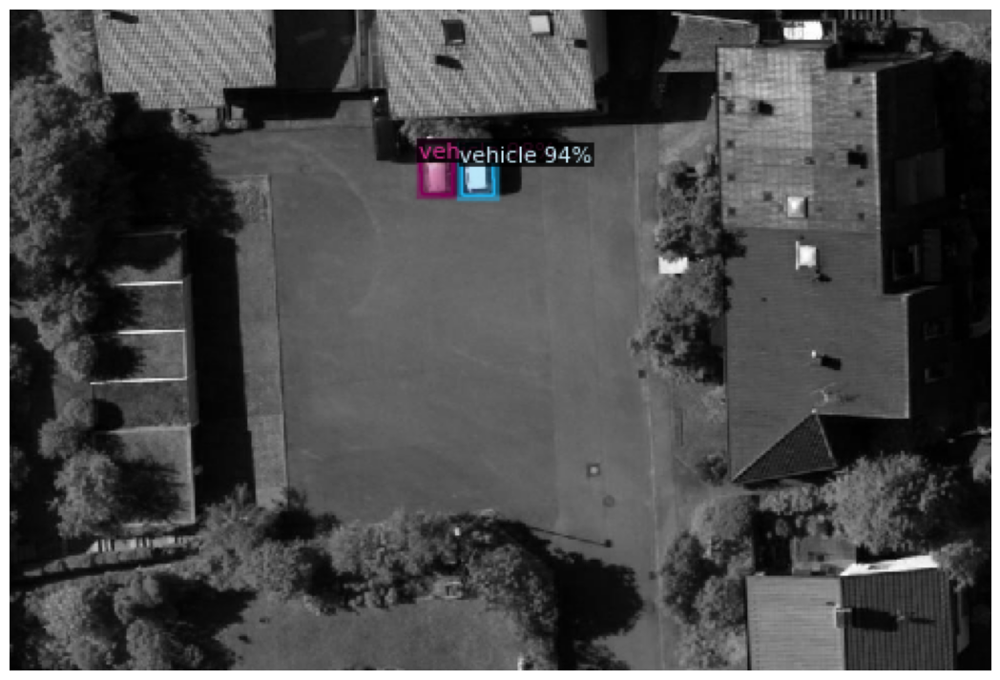

In [ ]:
import cv2
for path in test_imgs[:10]:
    im = cv2.imread('/kaggle/input/nwpu-vhr-10/NWPU VHR-10/test/'+path)
    outputs = predictor(im)

    v = Visualizer(im[:, :, ::-1],
                   metadata= metadata_dicts,
                   scale=0.5,
                   instance_mode=ColorMode.IMAGE_BW)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    img = cv2.cvtColor(out.get_image()[:, :, ::-1], cv2.COLOR_RGBA2RGB)
    plt.imshow(img)
    plt.axis('off')
    plt.show()